# Anticipez les besoins en consommation électrique de bâtiments

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import spatial,stats
%matplotlib inline
plt.rcParams["figure.figsize"] = [10, 5]
import seaborn as sns
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [2]:
data_2015 = pd.read_csv('2015-building-energy-benchmarking.csv')
data_2016 = pd.read_csv('2016-building-energy-benchmarking.csv')

In [3]:
print(data_2015.shape)
print(data_2016.shape)

(3340, 47)
(3376, 46)


In [4]:
data_2015.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'TaxParcelIdentificationNumber', 'Location',
       'CouncilDistrictCode', 'Neighborhood', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'OtherFuelUse(kBtu)',
       'GHGEmissions(MetricTonsCO2e)', 'GHGEmissionsIntensity(kgCO2e/ft2)',
       'DefaultData', '

In [5]:
data_2016.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State', 'ZipCode',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'DefaultData', 'Comments', 'ComplianceStatus',
       'Outlier

In [6]:
data_2015.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,"{'latitude': '47.61219025', 'longitude': '-122...",7,DOWNTOWN,1927,1,12.000,88434,0,88434,Hotel,Hotel,88434.000,NaN,NaN,NaN,NaN,NaN,65.000,78.900,80.300,173.500,175.100,6981428.000,7097539.000,2023032.000,1080307.000,3686160.000,12724.000,1272388.000,0.000,249.430,2.640,No,NaN,Compliant,NaN,NaN,14.000,NaN,31.000,18081
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,"{'latitude': '47.61310583', 'longitude': '-122...",7,DOWNTOWN,1996,1,11.000,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.000,Parking,15064.000,Restaurant,4622.000,NaN,51.000,94.400,99.000,191.300,195.200,8354235.000,8765788.000,0.000,1144563.000,3905411.000,44490.000,4448985.000,0.000,263.510,2.380,No,NaN,Compliant,NaN,NaN,14.000,NaN,31.000,18081
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,"{'latitude': '47.61334897', 'longitude': '-122...",7,DOWNTOWN,1969,1,41.000,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.000,Parking,100000.000,Swimming Pool,0.000,NaN,18.000,96.600,99.700,242.700,246.500,73130656.000,75506272.000,19660404.000,14583930.000,49762435.000,37099.000,3709900.000,0.000,2061.480,1.920,Yes,NaN,Compliant,NaN,NaN,56.000,NaN,31.000,18081
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,"{'latitude': '47.61421585', 'longitude': '-122...",7,DOWNTOWN,1926,1,10.000,61320,0,61320,Hotel,Hotel,61320.000,NaN,NaN,NaN,NaN,NaN,1.000,460.400,462.500,636.300,643.200,28229320.000,28363444.000,23458518.000,811521.000,2769023.000,20019.000,2001894.000,0.000,1936.340,31.380,No,NaN,Compliant,High Outlier,NaN,56.000,NaN,31.000,18081
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,"{'latitude': '47.6137544', 'longitude': '-122....",7,DOWNTOWN,1980,1,18.000,119890,12460,107430,"Hotel, Parking, Swimming Pool",Hotel,123445.000,Parking,68009.000,Swimming Pool,0.000,NaN,67.000,120.100,122.100,228.800,227.100,14829099.000,15078243.000,0.000,1777841.000,6066245.000,87631.000,8763105.000,0.000,507.700,4.020,No,NaN,Compliant,NaN,NaN,56.000,NaN,31.000,19576


In [7]:
data_2016.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.000,0659000030,7,DOWNTOWN,47.612,-122.338,1927,1.000,12,88434,0,88434,Hotel,Hotel,88434.000,NaN,NaN,NaN,NaN,NaN,60.000,81.700,84.300,182.500,189.000,7226362.500,7456910.000,2003882.000,1156514.250,3946027.000,12764.529,1276453.000,False,NaN,Compliant,NaN,249.980,2.830
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.000,0659000220,7,DOWNTOWN,47.613,-122.334,1996,1.000,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.000,Parking,15064.000,Restaurant,4622.000,NaN,61.000,94.800,97.900,176.100,179.400,8387933.000,8664479.000,0.000,950425.188,3242851.000,51450.816,5145082.000,False,NaN,Compliant,NaN,295.860,2.860
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.000,0659000475,7,DOWNTOWN,47.614,-122.338,1969,1.000,41,956110,196718,759392,Hotel,Hotel,756493.000,NaN,NaN,NaN,NaN,NaN,43.000,96.000,97.700,241.900,244.100,72587024.000,73937112.000,21566554.000,14515435.000,49526664.000,14938.000,1493800.000,False,NaN,Compliant,NaN,2089.280,2.190
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.000,0659000640,7,DOWNTOWN,47.614,-122.337,1926,1.000,10,61320,0,61320,Hotel,Hotel,61320.000,NaN,NaN,NaN,NaN,NaN,56.000,110.800,113.300,216.200,224.000,6794584.000,6946800.500,2214446.250,811525.312,2768924.000,18112.131,1811213.000,False,NaN,Compliant,NaN,286.430,4.670
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.000,0659000970,7,DOWNTOWN,47.614,-122.340,1980,1.000,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.000,Parking,68009.000,Swimming Pool,0.000,NaN,75.000,114.800,118.700,211.400,215.600,14172606.000,14656503.000,0.000,1573448.625,5368607.000,88039.984,8803998.000,False,NaN,Compliant,NaN,505.010,2.880


<function matplotlib.pyplot.show(close=None, block=None)>

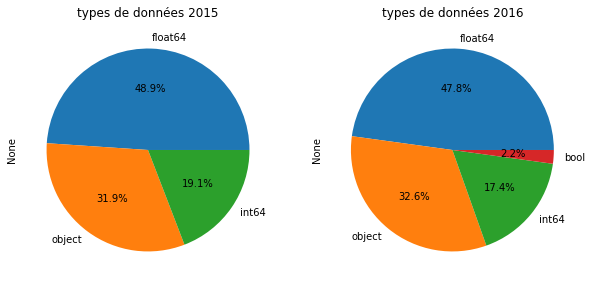

In [8]:
plt.subplot(1, 2, 1)
data_2015.dtypes.value_counts().plot.pie(autopct='%1.1f%%')
plt.title("types de données 2015")
plt.show
plt.subplot(1, 2, 2)
data_2016.dtypes.value_counts().plot.pie(autopct='%1.1f%%')
plt.title("types de données 2016")
plt.show

Text(0.5, 1.0, 'Remplissage 2015 ')

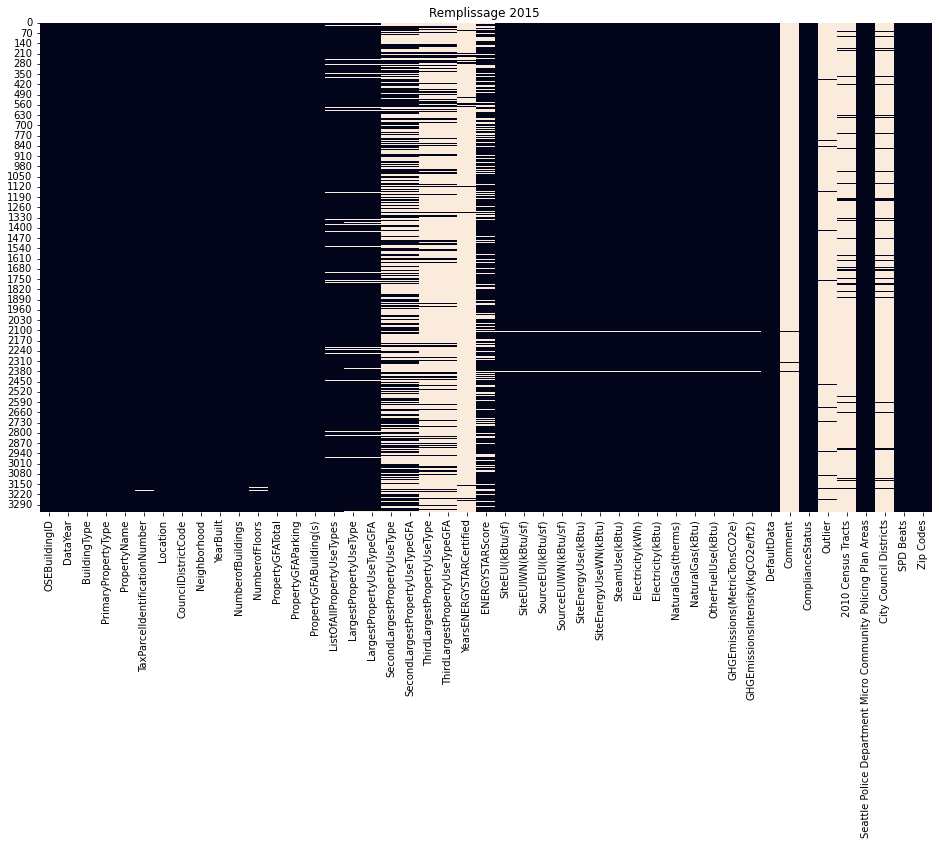

In [9]:
plt.figure(figsize=(16,9))
graph = sns.heatmap(data_2015.isna(),cbar=False)
plt.title('Remplissage 2015 ')

Text(0.5, 1.0, 'Remplissage 2016 ')

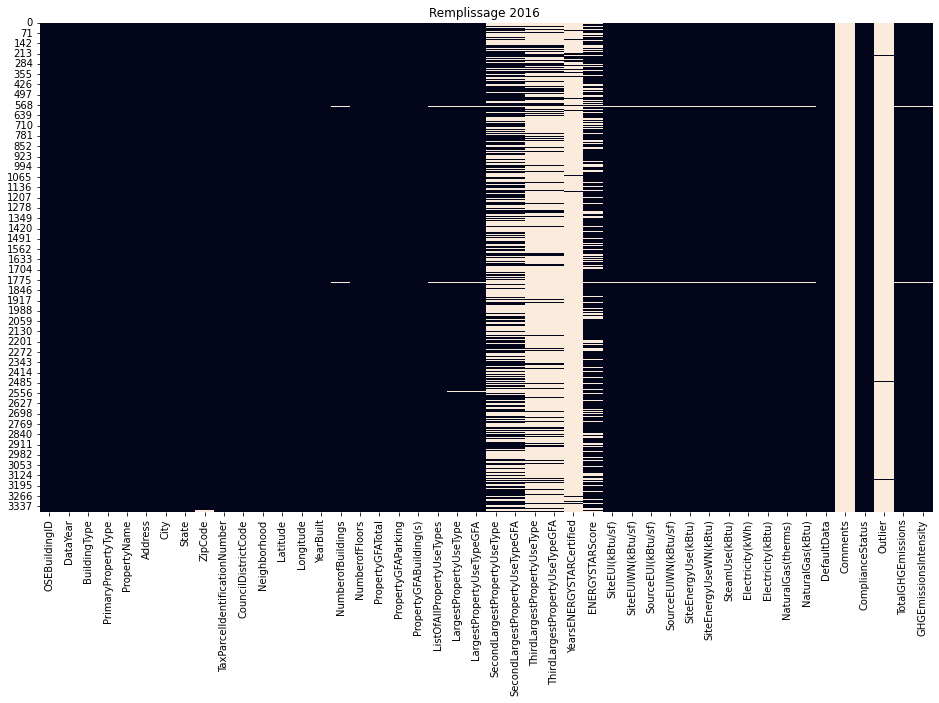

In [10]:
plt.figure(figsize=(16,9))
graph = sns.heatmap(data_2016.isna(),cbar=False)
plt.title('Remplissage 2016 ')

In [11]:
set(data_2015.columns) - set(data_2016.columns)

{'2010 Census Tracts',
 'City Council Districts',
 'Comment',
 'GHGEmissions(MetricTonsCO2e)',
 'GHGEmissionsIntensity(kgCO2e/ft2)',
 'Location',
 'OtherFuelUse(kBtu)',
 'SPD Beats',
 'Seattle Police Department Micro Community Policing Plan Areas',
 'Zip Codes'}

In [12]:
set(data_2016.columns) - set(data_2015.columns)

{'Address',
 'City',
 'Comments',
 'GHGEmissionsIntensity',
 'Latitude',
 'Longitude',
 'State',
 'TotalGHGEmissions',
 'ZipCode'}

Des erreurs de syntaxe sont présentes ainsi qu'une mauvaise gestion du format de donnée pour les données géographiques.

### Refactoring de la colonne Location de 2015

In [13]:
data_2015['Location']

0       {'latitude': '47.61219025', 'longitude': '-122...
1       {'latitude': '47.61310583', 'longitude': '-122...
2       {'latitude': '47.61334897', 'longitude': '-122...
3       {'latitude': '47.61421585', 'longitude': '-122...
4       {'latitude': '47.6137544', 'longitude': '-122....
                              ...                        
3335    {'latitude': '47.59950256', 'longitude': '-122...
3336    {'latitude': '47.65752471', 'longitude': '-122...
3337    {'latitude': '47.61649845', 'longitude': '-122...
3338    {'latitude': '47.68396954', 'longitude': '-122...
3339    {'latitude': '47.68396954', 'longitude': '-122...
Name: Location, Length: 3340, dtype: object

In [14]:
data_2015['Location'][0]

'{\'latitude\': \'47.61219025\', \'longitude\': \'-122.33799744\', \'human_address\': \'{"address": "405 OLIVE WAY", "city": "SEATTLE", "state": "WA", "zip": "98101"}\'}'

Transformation de fomat en dictionnaire propre

In [15]:
data_2015['Location']=data_2015['Location'].apply(eval)

In [16]:
data_2015['Location'][0]

{'latitude': '47.61219025',
 'longitude': '-122.33799744',
 'human_address': '{"address": "405 OLIVE WAY", "city": "SEATTLE", "state": "WA", "zip": "98101"}'}

In [17]:
location = data_2015["Location"].apply(pd.Series)
location['human_address']=location['human_address'].apply(eval)

In [18]:
location

,latitude,longitude,human_address
0,47.61219025,-122.33799744,"{'address': '405 OLIVE WAY', 'city': 'SEATTLE'..."
1,47.61310583,-122.33335756,"{'address': '724 PINE ST', 'city': 'SEATTLE', ..."
2,47.61334897,-122.33769944,"{'address': '1900 5TH AVE', 'city': 'SEATTLE',..."
3,47.61421585,-122.33660889,"{'address': '620 STEWART ST', 'city': 'SEATTLE..."
4,47.6137544,-122.3409238,"{'address': '401 LENORA ST', 'city': 'SEATTLE'..."
...,...,...,...
3335,47.59950256,-122.32034302,"{'address': '321 10TH AVE S', 'city': 'SEATTLE..."
3336,47.65752471,-122.3160159,"{'address': '4123 12TH AVE NE', 'city': 'SEATT..."
3337,47.61649845,-122.33770787,"{'address': '2030 8TH AVE', 'city': 'SEATTLE',..."
3338,47.68396954,-122.2874088,"{'address': '3801 NE 77TH ST', 'city': 'SEATTL..."


In [19]:
location= pd.concat([location.drop(['human_address'], axis=1),
                     location['human_address'].apply(pd.Series)], axis=1 )

In [20]:
location

,latitude,longitude,address,city,state,zip
0,47.61219025,-122.33799744,405 OLIVE WAY,SEATTLE,WA,98101
1,47.61310583,-122.33335756,724 PINE ST,SEATTLE,WA,98101
2,47.61334897,-122.33769944,1900 5TH AVE,SEATTLE,WA,98101
3,47.61421585,-122.33660889,620 STEWART ST,SEATTLE,WA,98101
4,47.6137544,-122.3409238,401 LENORA ST,SEATTLE,WA,98121
...,...,...,...,...,...,...
3335,47.59950256,-122.32034302,321 10TH AVE S,SEATTLE,WA,98104
3336,47.65752471,-122.3160159,4123 12TH AVE NE,SEATTLE,WA,98105
3337,47.61649845,-122.33770787,2030 8TH AVE,SEATTLE,WA,98121
3338,47.68396954,-122.2874088,3801 NE 77TH ST,SEATTLE,WA,98115


Le zip code est déja dans nos données, on le drop

In [21]:
location.drop(columns='zip' ,inplace=True)

In [22]:
data_2015= pd.concat([data_2015.drop(['Location'], axis=1), location], axis=1 )

In [23]:
data_2015[data_2015.columns[-5:]]

,latitude,longitude,address,city,state
0,47.61219025,-122.33799744,405 OLIVE WAY,SEATTLE,WA
1,47.61310583,-122.33335756,724 PINE ST,SEATTLE,WA
2,47.61334897,-122.33769944,1900 5TH AVE,SEATTLE,WA
3,47.61421585,-122.33660889,620 STEWART ST,SEATTLE,WA
4,47.6137544,-122.3409238,401 LENORA ST,SEATTLE,WA
...,...,...,...,...,...
3335,47.59950256,-122.32034302,321 10TH AVE S,SEATTLE,WA
3336,47.65752471,-122.3160159,4123 12TH AVE NE,SEATTLE,WA
3337,47.61649845,-122.33770787,2030 8TH AVE,SEATTLE,WA
3338,47.68396954,-122.2874088,3801 NE 77TH ST,SEATTLE,WA


### Traitement des noms de colonnes différentes 

In [24]:
set(data_2015.columns) - set(data_2016.columns)

{'2010 Census Tracts',
 'City Council Districts',
 'Comment',
 'GHGEmissions(MetricTonsCO2e)',
 'GHGEmissionsIntensity(kgCO2e/ft2)',
 'OtherFuelUse(kBtu)',
 'SPD Beats',
 'Seattle Police Department Micro Community Policing Plan Areas',
 'Zip Codes',
 'address',
 'city',
 'latitude',
 'longitude',
 'state'}

In [25]:
set(data_2016.columns) - set(data_2015.columns)

{'Address',
 'City',
 'Comments',
 'GHGEmissionsIntensity',
 'Latitude',
 'Longitude',
 'State',
 'TotalGHGEmissions',
 'ZipCode'}

In [26]:
data_2015['GHGEmissionsIntensity(kgCO2e/ft2)'].describe()

count   3330.000
mean       0.985
std        1.637
min        0.000
25%        0.080
50%        0.460
75%        1.180
max       31.380
Name: GHGEmissionsIntensity(kgCO2e/ft2), dtype: float64

In [27]:
data_2016['GHGEmissionsIntensity'].describe()

count   3367.000
mean       1.176
std        1.821
min       -0.020
25%        0.210
50%        0.610
75%        1.370
max       34.090
Name: GHGEmissionsIntensity, dtype: float64

In [28]:
data_2015['GHGEmissions(MetricTonsCO2e)'].describe()

count    3330.000
mean      110.094
std       409.450
min         0.000
25%         9.265
50%        32.740
75%        88.642
max     11824.890
Name: GHGEmissions(MetricTonsCO2e), dtype: float64

In [29]:
data_2016['TotalGHGEmissions'].describe()

count    3367.000
mean      119.724
std       538.832
min        -0.800
25%         9.495
50%        33.920
75%        93.940
max     16870.980
Name: TotalGHGEmissions, dtype: float64

Nous avons même ordre de grandeur pour les colonnes. on peut renommer

In [30]:
data_2015.rename(columns = {'address':'Address',
                            'city' :'City',
                            'latitude':'Latitude',
                            'longitude':'Longitude',
                            'state':'State',
                            'Zip Codes':'ZipCode',
                            'GHGEmissionsIntensity(kgCO2e/ft2)':'GHGEmissionsIntensity'
                            ,'Comment':'Comments'}, inplace = True)
data_2016.rename(columns = {'TotalGHGEmissions':'GHGEmissions(MetricTonsCO2e)'}, inplace = True)

In [31]:
set(data_2015.columns) - set(data_2016.columns)

{'2010 Census Tracts',
 'City Council Districts',
 'OtherFuelUse(kBtu)',
 'SPD Beats',
 'Seattle Police Department Micro Community Policing Plan Areas'}

In [32]:
set(data_2016.columns) - set(data_2015.columns)

set()

In [33]:
data_2015[['2010 Census Tracts','City Council Districts',
 'OtherFuelUse(kBtu)',
 'SPD Beats',
 'Seattle Police Department Micro Community Policing Plan Areas']].describe()

,2010 Census Tracts,City Council Districts,OtherFuelUse(kBtu),SPD Beats,Seattle Police Department Micro Community Policing Plan Areas
count,224.000,213.000,3330.000,3338.000,3338.000
mean,123.062,1.347,7142.301,24.826,32.380
std,5.812,0.477,196279.004,15.006,19.908
min,116.000,1.000,0.000,1.000,1.000
25%,117.000,1.000,0.000,10.000,14.000
50%,123.000,1.000,0.000,26.000,33.000
75%,125.500,2.000,0.000,38.000,50.000
max,135.000,2.000,8269669.000,51.000,61.000


Les deux premières colonnes montrent un faible taux de remplissage. Les deux dernières concernent des indicateurs géographiques pour la police locale. Ces 4 colonnes peuvent etre drop.

In [34]:
data_2015.drop(columns=['2010 Census Tracts','City Council Districts','SPD Beats',
                        'Seattle Police Department Micro Community Policing Plan Areas'],
               inplace=True)

## Vérifications des types

In [35]:
datatype = pd.DataFrame([data_2015.dtypes, data_2016.dtypes])
datatype

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity,DefaultData,Comments,ComplianceStatus,Outlier,ZipCode,Latitude,Longitude,Address,City,State
0,int64,int64,object,object,object,object,int64,object,int64,int64,float64,int64,int64,int64,object,object,float64,object,float64,object,float64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,object,object,object,int64,object,object,object,object,object
1,int64,int64,object,object,object,object,int64,object,int64,float64,int64,int64,int64,int64,object,object,float64,object,float64,object,float64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,NaN,float64,float64,bool,float64,object,object,float64,float64,float64,object,object,object


In [36]:
for col in datatype.columns:
    if str(datatype[col][0]) != str(datatype[col][1]):
            print( 'Erreur de typage pour la colonne :',col,
                  '; v1: ',str(datatype[col][0]),'v2:',str(datatype[col][1]))

Erreur de typage pour la colonne : NumberofBuildings ; v1:  int64 v2: float64
Erreur de typage pour la colonne : NumberofFloors ; v1:  float64 v2: int64
Erreur de typage pour la colonne : OtherFuelUse(kBtu) ; v1:  float64 v2: nan
Erreur de typage pour la colonne : DefaultData ; v1:  object v2: bool
Erreur de typage pour la colonne : Comments ; v1:  object v2: float64
Erreur de typage pour la colonne : ZipCode ; v1:  int64 v2: float64
Erreur de typage pour la colonne : Latitude ; v1:  object v2: float64
Erreur de typage pour la colonne : Longitude ; v1:  object v2: float64


In [37]:
data_2015['NumberofFloors'] = data_2015['NumberofFloors'].notna().astype('int64')
data_2015[['Latitude','Longitude', 'ZipCode']] = data_2015[['Latitude','Longitude', 'ZipCode']].astype('float64')
data_2016['Comments'] = data_2016['Comments'].notna().astype('object')
data_2016['NumberofBuildings'] = data_2016['NumberofBuildings'].notna().astype('int64')

## Merge des datasets

In [38]:
data = pd.concat([data_2015, data_2016], ignore_index=True)

In [39]:
data.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity,DefaultData,Comments,ComplianceStatus,Outlier,ZipCode,Latitude,Longitude,Address,City,State
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,7,DOWNTOWN,1927,1,1,88434,0,88434,Hotel,Hotel,88434.000,NaN,NaN,NaN,NaN,NaN,65.000,78.900,80.300,173.500,175.100,6981428.000,7097539.000,2023032.000,1080307.000,3686160.000,12724.000,1272388.000,0.000,249.430,2.640,No,NaN,Compliant,NaN,18081.000,47.612,-122.338,405 OLIVE WAY,SEATTLE,WA
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,7,DOWNTOWN,1996,1,1,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.000,Parking,15064.000,Restaurant,4622.000,NaN,51.000,94.400,99.000,191.300,195.200,8354235.000,8765788.000,0.000,1144563.000,3905411.000,44490.000,4448985.000,0.000,263.510,2.380,No,NaN,Compliant,NaN,18081.000,47.613,-122.333,724 PINE ST,SEATTLE,WA
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,7,DOWNTOWN,1969,1,1,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.000,Parking,100000.000,Swimming Pool,0.000,NaN,18.000,96.600,99.700,242.700,246.500,73130656.000,75506272.000,19660404.000,14583930.000,49762435.000,37099.000,3709900.000,0.000,2061.480,1.920,Yes,NaN,Compliant,NaN,18081.000,47.613,-122.338,1900 5TH AVE,SEATTLE,WA
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,7,DOWNTOWN,1926,1,1,61320,0,61320,Hotel,Hotel,61320.000,NaN,NaN,NaN,NaN,NaN,1.000,460.400,462.500,636.300,643.200,28229320.000,28363444.000,23458518.000,811521.000,2769023.000,20019.000,2001894.000,0.000,1936.340,31.380,No,NaN,Compliant,High Outlier,18081.000,47.614,-122.337,620 STEWART ST,SEATTLE,WA
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,7,DOWNTOWN,1980,1,1,119890,12460,107430,"Hotel, Parking, Swimming Pool",Hotel,123445.000,Parking,68009.000,Swimming Pool,0.000,NaN,67.000,120.100,122.100,228.800,227.100,14829099.000,15078243.000,0.000,1777841.000,6066245.000,87631.000,8763105.000,0.000,507.700,4.020,No,NaN,Compliant,NaN,19576.000,47.614,-122.341,401 LENORA ST,SEATTLE,WA


In [40]:
data.shape

(6716, 47)

In [41]:
data.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'TaxParcelIdentificationNumber', 'CouncilDistrictCode',
       'Neighborhood', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'YearsENERGYSTARCertified',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)',
       'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)',
       'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)', 'Electricity(kWh)',
       'Electricity(kBtu)', 'NaturalGas(therms)', 'NaturalGas(kBtu)',
       'OtherFuelUse(kBtu)', 'GHGEmissions(MetricTonsCO2e)',
       'GHGEmissionsIntensity', 'DefaultData', 'Comments', 'ComplianceStatus',


In [42]:
data.to_csv('data_merged.csv',index = False, header=True)

In [43]:
data= pd.read_csv('data_merged.csv')

In [44]:
data.shape

(6716, 47)

Text(0.5, 1.0, 'Remplissage  ')

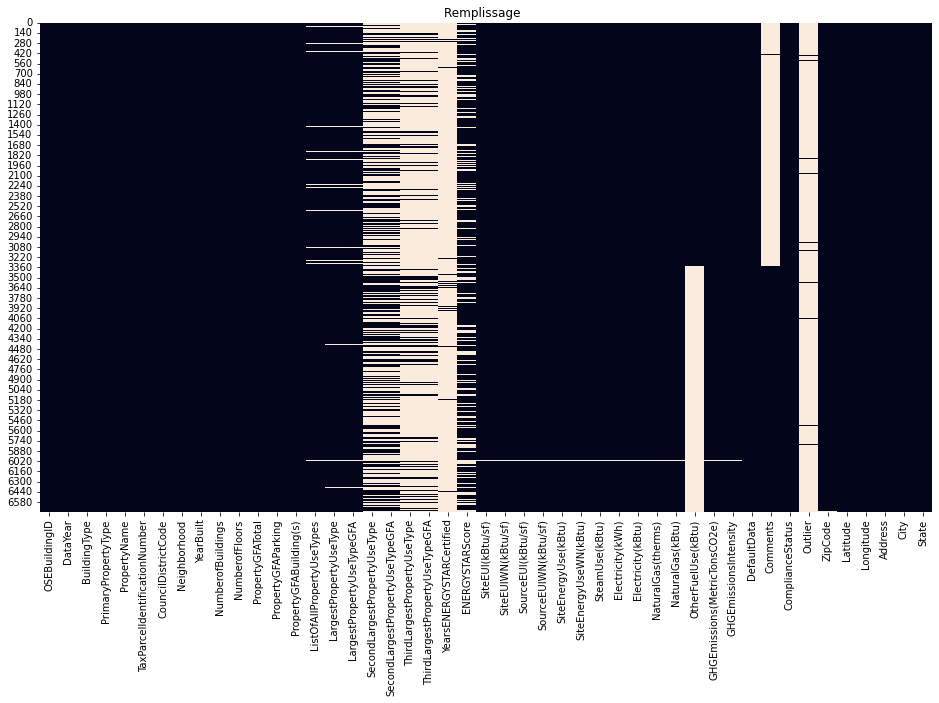

In [45]:
plt.figure(figsize=(16,9))
graph = sns.heatmap(data.isna(),cbar=False)
plt.title('Remplissage  ')

In [46]:
df_diff = data.drop_duplicates(subset=['OSEBuildingID'],keep=False)

In [47]:
df_diff.sort_values(by='OSEBuildingID')

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity,DefaultData,Comments,ComplianceStatus,Outlier,ZipCode,Latitude,Longitude,Address,City,State
3375,43,2016,Campus,Mixed Use Property,Plant 2 Site,0022000005,2,GREATER DUWAMISH,1992,1,3,494835,0,494835,"Energy/Power Station, Laboratory, Manufacturin...",Office,757027.000,Laboratory,639931.000,Non-Refrigerated Warehouse,459748.000,NaN,8.000,221.700,233.100,388.200,400.300,448385312.000,471613856.000,0.000,44102076.000,150476283.000,2979090.000,297909000.000,NaN,16870.980,34.090,False,False,Compliant,NaN,98108.000,47.535,-122.318,7755 E MARGINAL WAY S,Seattle,WA
47,61,2015,Multifamily LR (1-4),Low-Rise Multifamily,GATEWOOD APTS,1975700600,7,DOWNTOWN,1900,1,1,48383,0,48383,"Multifamily Housing, Retail Store",Multifamily Housing,38172.000,Retail Store,10211.000,NaN,NaN,NaN,75.000,61.000,69.900,129.600,139.400,2953338.000,3379678.000,915977.000,424619.000,1448859.000,5886.000,588563.000,0.000,112.060,2.190,No,NaN,Compliant,NaN,18081.000,47.610,-122.340,107 PINE ST,SEATTLE,WA
165,266,2015,Multifamily LR (1-4),Low-Rise Multifamily,WEST SEATTLE COMM. RESOURCE CENTER/FOOD BANK A...,9271000000,1,DELRIDGE,2007,1,1,52134,0,52134,Multifamily Housing,Multifamily Housing,52134.000,NaN,NaN,NaN,NaN,NaN,85.000,23.300,26.300,73.000,82.500,1212551.000,1369895.000,0.000,355378.000,1212601.000,0.000,0.000,0.000,8.450,0.060,Yes,NaN,Compliant,NaN,19581.000,47.544,-122.376,6500 35TH AVE SW,SEATTLE,WA
204,325,2015,NonResidential,Retail Store,WESTLAKE MALL RETAIL PORTION,659000005,7,DOWNTOWN,1989,1,1,111077,0,111077,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,91.000,60.600,62.100,190.200,195.100,9898724.000,10155788.000,0.000,2901150.000,9899135.000,0.000,0.000,0.000,69.010,0.240,No,NaN,Compliant,NaN,18081.000,47.612,-122.337,400 PINE ST,SEATTLE,WA
3579,364,2016,NonResidential,Large Office,UW Tower Bldg Complex,1142000280,4,NORTHEAST,1971,1,23,474546,0,474546,Office,Office,474546.000,NaN,NaN,NaN,NaN,NaN,77.000,60.000,63.200,188.300,198.500,28450436.000,29997380.000,0.000,8338345.000,28450433.000,0.000,0.000,NaN,198.340,0.420,False,False,Compliant,NaN,98195.000,47.661,-122.315,4333 Brooklyn Ave,Seattle,WA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6711,50222,2016,Nonresidential COS,Office,Horticulture building,1624049080,2,GREATER DUWAMISH,1990,1,1,12294,0,12294,Office,Office,12294.000,NaN,NaN,NaN,NaN,NaN,46.000,69.100,76.700,161.700,176.100,849745.688,943003.188,0.000,153655.000,524270.860,3254.750,325475.024,NaN,20.940,1.700,True,False,Error - Correct Default Data,NaN,NaN,47.567,-122.312,1600 S Dakota St,Seattle,WA
6712,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,3558300000,2,DOWNTOWN,2004,1,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.000,NaN,NaN,NaN,NaN,NaN,NaN,59.400,65.900,114.200,118.900,950276.188,1053705.750,0.000,116221.000,396546.052,5537.300,553729.980,NaN,32.170,2.010,False,False,Compliant,NaN,NaN,47.596,-122.323,719 8th Ave S,Seattle,WA
6713,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1794501150,7,MAGNOLIA / QUEEN ANNE,1974,1,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recrea...",Other - Recreation,7583.000,Fitness 

In [48]:
df_diff[df_diff['DataYear']==2015]['OSEBuildingID'].nunique()

56

56 Batiments 'détruits' en 2015

In [49]:
df_diff[df_diff['DataYear']==2016]['OSEBuildingID'].nunique()

92

92 Batiments 'construits' en 2016

In [50]:
import folium
carte = folium.Map()
carte = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()],
                   zoom_start=11)
for i in range(0,len(data)):
    if i in df_diff[df_diff['DataYear']==2015]['OSEBuildingID'].index:
        folium.Circle([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']],color='red',
            fill_color='red', popup=data.iloc[i]['OSEBuildingID'], radius =100).add_to(carte)
    elif i in df_diff[df_diff['DataYear']==2016]['OSEBuildingID'].index:
            folium.Circle([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']],color='green',
            fill_color='green', popup=data.iloc[i]['OSEBuildingID'], radius =100).add_to(carte)
    else:
            folium.Circle([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']], 
                      popup=data.iloc[i]['OSEBuildingID'], radius =100).add_to(carte)
carte

In [51]:
liste_bat=df_diff.OSEBuildingID.tolist()
data[~data.OSEBuildingID.isin(liste_bat)]['OSEBuildingID'].nunique()

3284

Nous avons une base commune de **3284** batiments entre 2015 et 2016

## Choix Targets

In [52]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6716 entries, 0 to 6715
Data columns (total 47 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    6716 non-null   int64  
 1   DataYear                         6716 non-null   int64  
 2   BuildingType                     6716 non-null   object 
 3   PrimaryPropertyType              6716 non-null   object 
 4   PropertyName                     6716 non-null   object 
 5   TaxParcelIdentificationNumber    6714 non-null   object 
 6   CouncilDistrictCode              6716 non-null   int64  
 7   Neighborhood                     6716 non-null   object 
 8   YearBuilt                        6716 non-null   int64  
 9   NumberofBuildings                6716 non-null   int64  
 10  NumberofFloors                   6716 non-null   int64  
 11  PropertyGFATotal                 6716 non-null   int64  
 12  PropertyGFAParking  

Notre mission, rappelons-le, est de tenter de prédire les __émissions de CO2__ et la __consommation totale d’énergie__ et à évaluer l’intérêt de __l’ENERGY STAR Score__

Nous avons divers indicateurs possibles: 

- Au niveau consommation : 
        SiteEUI(kBtu/sf)
        SiteEUIWN(kBtu/sf)
        SourceEUI(kBtu/sf)
        SourceEUIWN(kBtu/sf)
        SiteEnergyUse(kBtu)
        SiteEnergyUseWN(kBtu)
        SteamUse(kBtu)
        Electricity(kWh)
        Electricity(kBtu)
        NaturalGas(therms)
        NaturalGas(kBtu)
    
- Au niveau Emissions : 
        GHGEmissions(MetricTonsCO2e)
        GHGEmissionsIntensity
    
- Energie Score :
        ENERGYSTARScore

La documentation issue du dataset nous renseigne sur la description de chaque variable. On retiendra ces deux la pour notre problème

__SiteEnergyUseWN(kBtu)__ : The annual amount of energy consumed by the property from all sources of energy, adjusted to what the property would have consumed during 30-year average weather conditions.

__GHGEmissions(MetricTonsCO2e)__ : The total amount of greenhouse gas emissions, including carbon dioxide, methane, and nitrous oxide gases released into the atmosphere as a result of energy consumption at the property, measured in metric tons of carbon dioxide equivalent

Et l'__ENERGYSTARScore__ pour notre dernière étude 

In [53]:
data.drop(columns=['SiteEUI(kBtu/sf)',
                    'SiteEUIWN(kBtu/sf)', 
                    'SourceEUI(kBtu/sf)',              
                    'SourceEUIWN(kBtu/sf)',            
                    'SiteEnergyUse(kBtu)',
                    'SteamUse(kBtu)',                   
                    'Electricity(kWh)',                 
                    'Electricity(kBtu)',              
                    'NaturalGas(therms)',               
                    'NaturalGas(kBtu)',
                    'GHGEmissionsIntensity'],
          inplace=True)

C:\Python3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='GHGEmissions(MetricTonsCO2e)', ylabel='Density'>

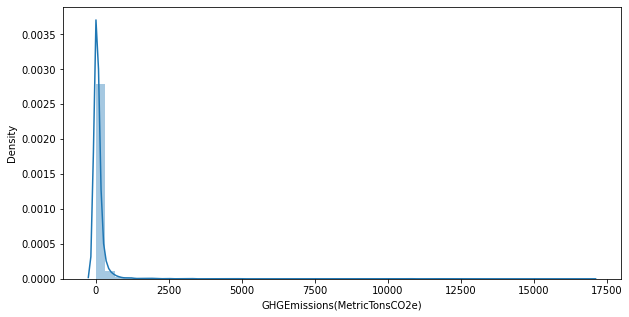

In [54]:
sns.distplot(data['GHGEmissions(MetricTonsCO2e)'])

C:\Python3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='SiteEnergyUseWN(kBtu)', ylabel='Density'>

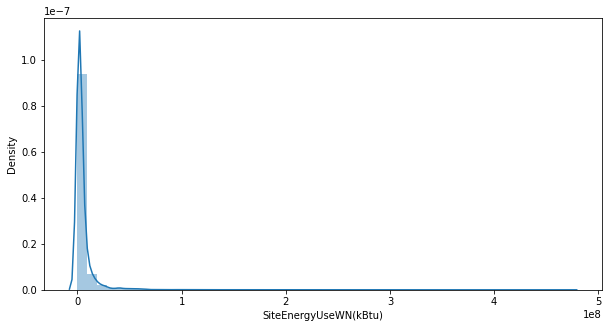

In [55]:
sns.distplot(data['SiteEnergyUseWN(kBtu)'])

Les deux graphes montrent la présence d'outliers

C:\Python3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='ENERGYSTARScore', ylabel='Density'>

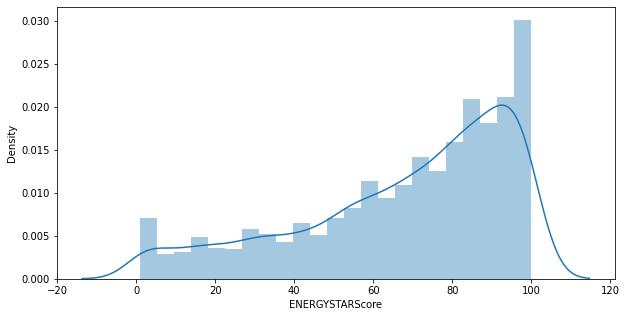

In [56]:
sns.distplot(data['ENERGYSTARScore'])

## Observations des colonnes 

In [57]:
for col in data.columns:
    print('Nombre de NaN dans la colonne',col,': ', data[col].isna().sum(), 'soit :', np.round((data[col].isna().sum()/len(data)*100), decimals=2),'%')
    
    if data[col].nunique()<=10:
        print(col, 'valeurs de la colonne : ', data[col].unique().tolist(), '\n')
    else:
        print(col, 'nombres de valeurs distinctes : ',data[col].nunique(),'\n')


Nombre de NaN dans la colonne OSEBuildingID :  0 soit : 0.0 %
OSEBuildingID nombres de valeurs distinctes :  3432 

Nombre de NaN dans la colonne DataYear :  0 soit : 0.0 %
DataYear valeurs de la colonne :  [2015, 2016] 

Nombre de NaN dans la colonne BuildingType :  0 soit : 0.0 %
BuildingType valeurs de la colonne :  ['NonResidential', 'Nonresidential COS', 'Multifamily MR (5-9)', 'SPS-District K-12', 'Multifamily LR (1-4)', 'Campus', 'Multifamily HR (10+)', 'Nonresidential WA'] 

Nombre de NaN dans la colonne PrimaryPropertyType :  0 soit : 0.0 %
PrimaryPropertyType nombres de valeurs distinctes :  32 

Nombre de NaN dans la colonne PropertyName :  0 soit : 0.0 %
PropertyName nombres de valeurs distinctes :  6527 

Nombre de NaN dans la colonne TaxParcelIdentificationNumber :  2 soit : 0.03 %
TaxParcelIdentificationNumber nombres de valeurs distinctes :  3729 

Nombre de NaN dans la colonne CouncilDistrictCode :  0 soit : 0.0 %
CouncilDistrictCode valeurs de la colonne :  [7, 3, 2, 

Nous pouvons faire un nettoyage sur des colonnes inutiles : 

    'City', 2 valeurs,
   
    'TaxParcelIdentificationNumber', On utilisera OSEBuildingID pour l'id,
    'Comments', Inutile et peu de valeurs,
    'YearsENERGYSTARCertified', aucun intêret sur notre probleme,
    'DefaultData', Inutile à notre analyse,
    'ComplianceStatus', Inutile à notre analyse

In [58]:
data.drop(columns=['City','State','TaxParcelIdentificationNumber',
                   'Comments','YearsENERGYSTARCertified','DefaultData','ComplianceStatus'],
          inplace=True)

In [59]:
data.shape

(6716, 29)

In [60]:
data.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'CouncilDistrictCode', 'Neighborhood', 'YearBuilt',
       'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore',
       'SiteEnergyUseWN(kBtu)', 'OtherFuelUse(kBtu)',
       'GHGEmissions(MetricTonsCO2e)', 'Outlier', 'ZipCode', 'Latitude',
       'Longitude', 'Address'],
      dtype='object')

# Analyse des variables catégoriques

In [61]:
data.select_dtypes(['object']).nunique()

BuildingType                       8
PrimaryPropertyType               32
PropertyName                    6527
Neighborhood                      19
ListOfAllPropertyUseTypes        488
LargestPropertyUseType            57
SecondLargestPropertyUseType      50
ThirdLargestPropertyUseType       45
Outlier                            4
Address                         6379
dtype: int64

In [62]:
cat_var=['BuildingType','Neighborhood', 'PrimaryPropertyType','LargestPropertyUseType']

In [63]:
#This function allows you to view the distributionof CO2 emissions or energy consumption within the classes of a variable.
def visualisation(variable,df,co2=1):
    visu = "GHGEmissions(MetricTonsCO2e)" if co2 else "SiteEnergyUseWN(kBtu)"
    the_mean=df[visu].mean()
    fig=plt.figure(figsize=[18,7])
    fig.patch.set_facecolor('#E0E0E0')
    fig.patch.set_alpha(0.7)
    plt.title(visu + " distribution by {}".format(variable),size=16)
    sns.boxplot(x=variable, y=visu, data=df,color="#cbd1db",width=0.5,showfliers=False,showmeans=True)
    plt.hlines(y=the_mean,xmin=-0.5,xmax=len(df[variable].unique())-0.5,color="#6d788b",ls="--",label="Global mean")

    plt.ylabel(visu,size=14)
    plt.xticks(range(0,len(df[variable].unique()))
               ,df[variable].unique(),rotation=90)
    plt.legend()
    plt.grid()
    plt.show()

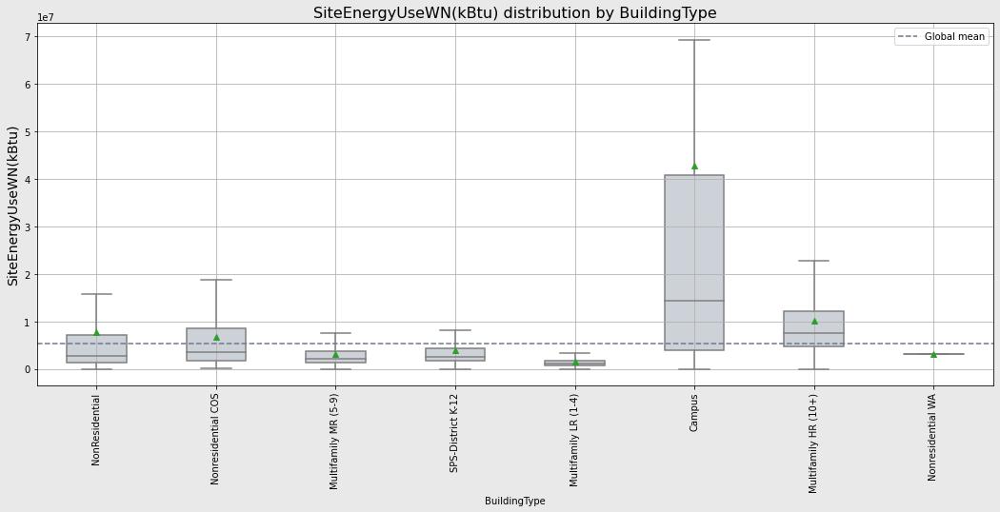

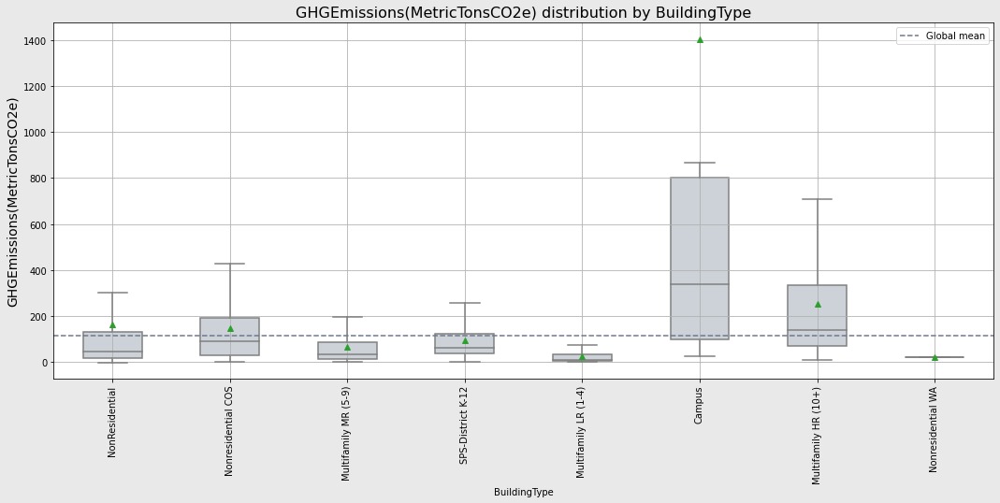

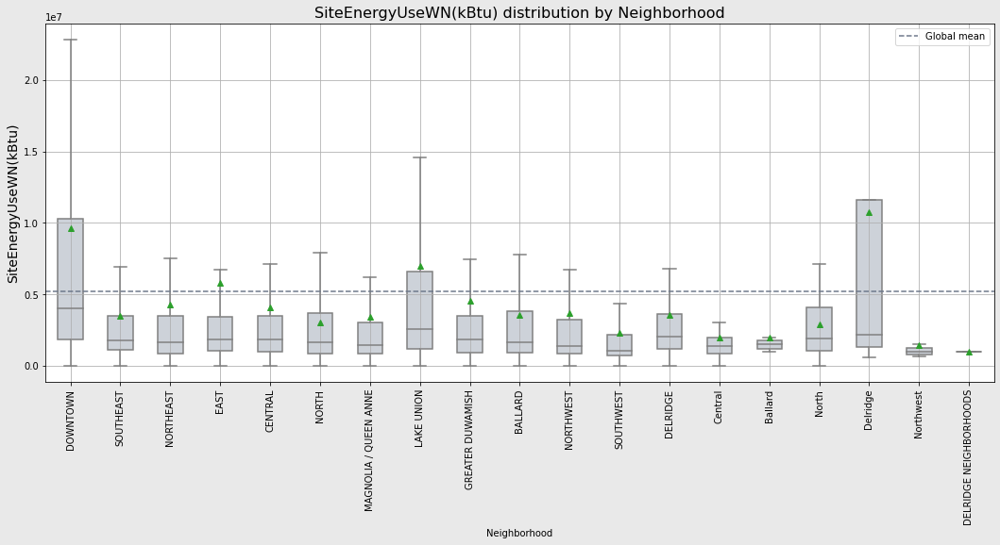

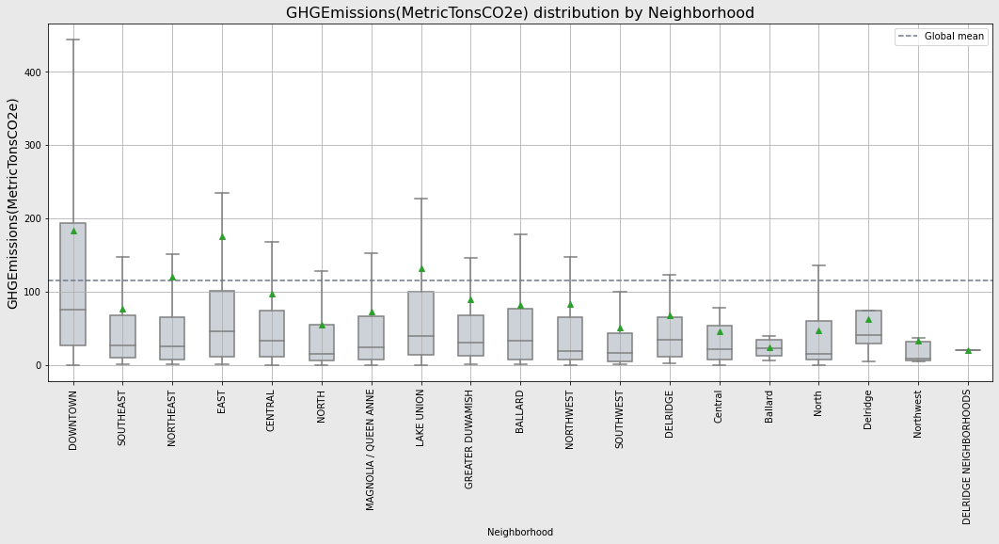

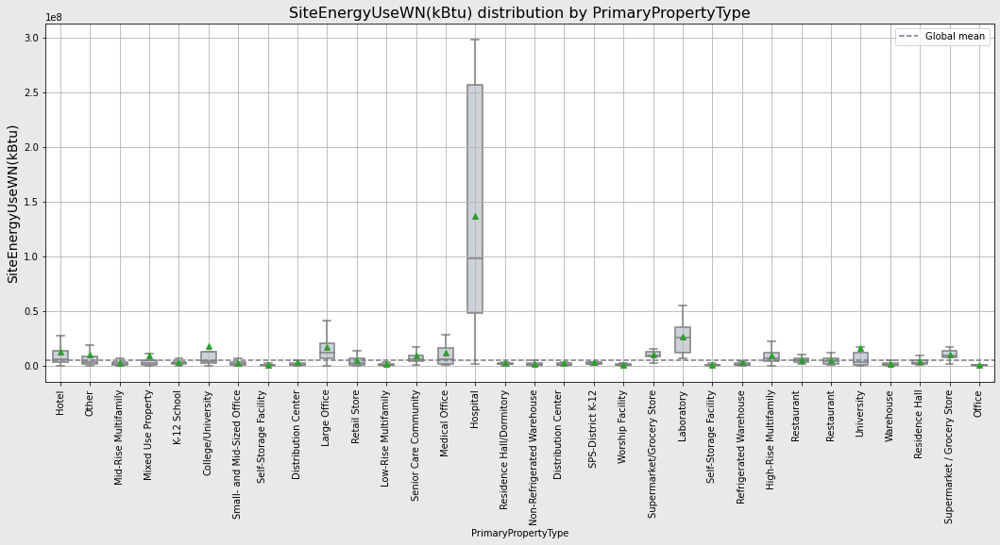

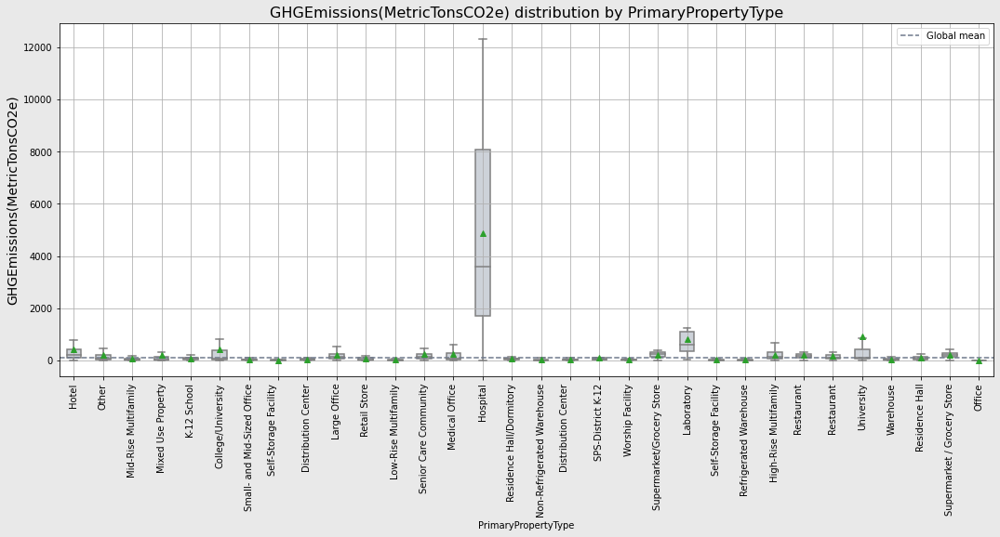

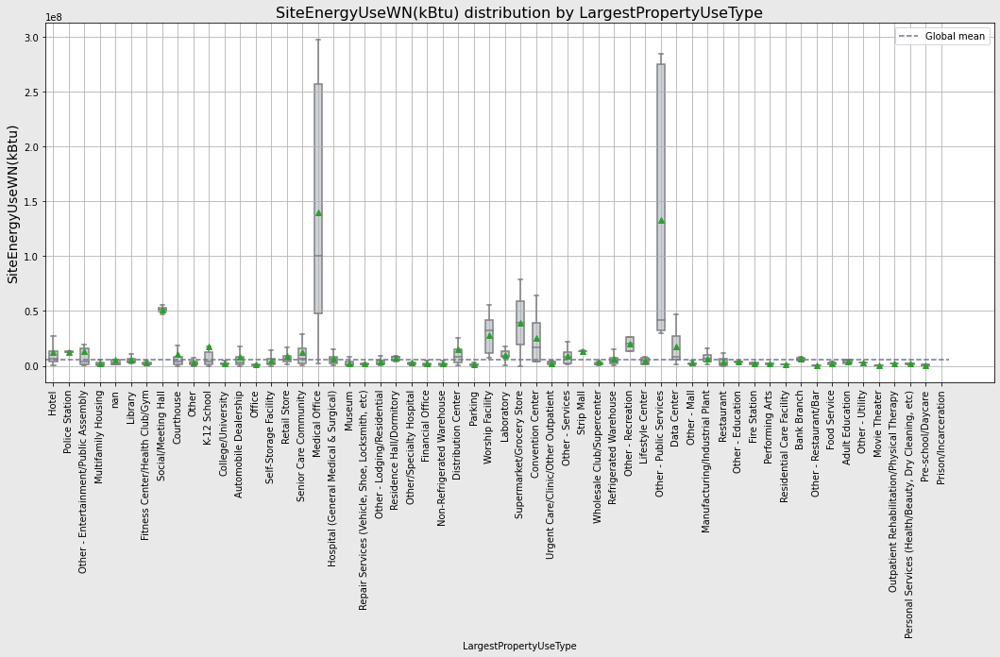

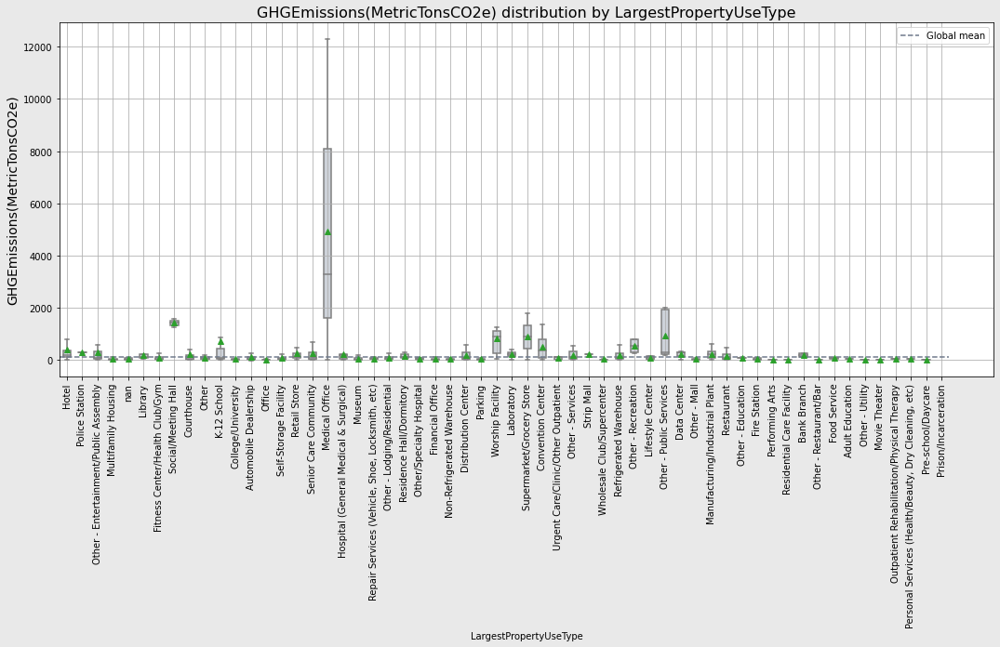

In [64]:
for var in cat_var:
    visualisation(var,data,co2=0)
    visualisation(var,data,co2=1)

In [65]:
data['ListOfAllPropertyUseTypes'] = data['ListOfAllPropertyUseTypes'].fillna('[]')

In [66]:
data['ListOfAllPropertyUseTypes'].unique()

array(['Hotel', 'Hotel, Parking, Restaurant',
       'Hotel, Parking, Swimming Pool', 'Police Station',
       'Other - Entertainment/Public Assembly', 'Multifamily Housing',
       '[]', 'Hotel, Parking', 'Data Center, Library, Parking',
       'Fitness Center/Health Club/Gym, Office, Swimming Pool',
       'Office, Other, Other - Lodging/Residential, Restaurant, Social/Meeting Hall',
       'Courthouse', 'Other', 'K-12 School', 'College/University',
       'Automobile Dealership',
       'Hotel, Parking, Retail Store, Swimming Pool',
       'K-12 School, Multifamily Housing, Office, Other - Entertainment/Public Assembly',
       'Self-Storage Facility', 'Non-Refrigerated Warehouse, Office',
       'Office, Other - Education',
       'Office, Self-Storage Facility, Vocational School',
       'Data Center, Office, Retail Store',
       'Non-Refrigerated Warehouse, Other, Retail Store',
       'Office, Retail Store',
       'Office, Other - Entertainment/Public Assembly, Restaurant',
  

In [67]:
data['PrimaryPropertyType'].unique()

array(['Hotel', 'Other', 'Mid-Rise Multifamily', 'Mixed Use Property',
       'K-12 School', 'College/University', 'Small- and Mid-Sized Office',
       'Self-Storage Facility\n', 'Distribution Center', 'Large Office',
       'Retail Store', 'Low-Rise Multifamily', 'Senior Care Community',
       'Medical Office', 'Hospital', 'Residence Hall/Dormitory',
       'Non-Refrigerated Warehouse', 'Distribution Center\n',
       'SPS-District K-12', 'Worship Facility',
       'Supermarket/Grocery Store', 'Laboratory', 'Self-Storage Facility',
       'Refrigerated Warehouse', 'High-Rise Multifamily', 'Restaurant\n',
       'Restaurant', 'University', 'Warehouse', 'Residence Hall',
       'Supermarket / Grocery Store', 'Office'], dtype=object)

In [68]:
data['LargestPropertyUseType'].unique()

array(['Hotel', 'Police Station', 'Other - Entertainment/Public Assembly',
       'Multifamily Housing', nan, 'Library',
       'Fitness Center/Health Club/Gym', 'Social/Meeting Hall',
       'Courthouse', 'Other', 'K-12 School', 'College/University',
       'Automobile Dealership', 'Office', 'Self-Storage Facility',
       'Retail Store', 'Senior Care Community', 'Medical Office',
       'Hospital (General Medical & Surgical)', 'Museum',
       'Repair Services (Vehicle, Shoe, Locksmith, etc)',
       'Other - Lodging/Residential', 'Residence Hall/Dormitory',
       'Other/Specialty Hospital', 'Financial Office',
       'Non-Refrigerated Warehouse', 'Distribution Center', 'Parking',
       'Worship Facility', 'Laboratory', 'Supermarket/Grocery Store',
       'Convention Center', 'Urgent Care/Clinic/Other Outpatient',
       'Other - Services', 'Strip Mall', 'Wholesale Club/Supercenter',
       'Refrigerated Warehouse', 'Other - Recreation', 'Lifestyle Center',
       'Other - Public S

In [69]:
data[data['PrimaryPropertyType'].isnull() & data['LargestPropertyUseType'].isnull()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),Outlier,ZipCode,Latitude,Longitude,Address


Nous remarquons qu'on peut renseigner les valeurs manquantes en s'inspirant de l'autre colonne

In [70]:
data['PrimaryPropertyType'] = data['PrimaryPropertyType'].str.replace('\n','')

In [71]:
listprimary=data['PrimaryPropertyType'].tolist()
list_total_cat=data['ListOfAllPropertyUseTypes'].tolist()
print(len((set(list_total_cat))), "categories disponibles")
list_diff=[]
list_commun=[]
for element in listprimary:
    if element not in list_total_cat:
        list_diff.append(element)
    else:
        list_commun.append(element)
print(len(set(list_diff))," Différences : ")    
print(list(set(list_diff)))
print(len(set(list_commun)),"En commun : ")
print(list(set(list_commun)))

489 categories disponibles
12  Différences : 
['Residence Hall', 'Small- and Mid-Sized Office', 'Mid-Rise Multifamily', 'Hospital', 'Mixed Use Property', 'High-Rise Multifamily', 'SPS-District K-12', 'Low-Rise Multifamily', 'Large Office', 'Warehouse', 'Supermarket / Grocery Store', 'University']
17 En commun : 
['Other', 'Restaurant', 'Non-Refrigerated Warehouse', 'Office', 'Worship Facility', 'College/University', 'Supermarket/Grocery Store', 'Senior Care Community', 'K-12 School', 'Self-Storage Facility', 'Residence Hall/Dormitory', 'Laboratory', 'Distribution Center', 'Refrigerated Warehouse', 'Retail Store', 'Hotel', 'Medical Office']


In [72]:
list_cat_use= listprimary + data['LargestPropertyUseType'].tolist() + data['SecondLargestPropertyUseType'].tolist() + data['ThirdLargestPropertyUseType'].tolist()
len(set(list_cat_use))

78

In [73]:
list_diff=[]
list_commun=[]
for element in list_cat_use:
    if element not in list_total_cat:
        list_diff.append(element)
    else:
        list_commun.append(element)
print(len(set(list_diff))," Différences : ")        
print(list(set(list_diff)))
print(len(set(list_commun)),"En commun : ")
print(list(set(list_commun)))

29  Différences : 
['Bar/Nightclub', 'Residence Hall', 'Enclosed Mall', nan, 'High-Rise Multifamily', 'Other - Mall', 'Convention Center', 'Fitness Center/Health Club/Gym', 'Mid-Rise Multifamily', 'Outpatient Rehabilitation/Physical Therapy', 'Low-Rise Multifamily', 'Warehouse', 'Other - Restaurant/Bar', 'Small- and Mid-Sized Office', 'Mixed Use Property', 'Other - Public Services', 'SPS-District K-12', 'Convenience Store without Gas Station', 'Food Sales', 'Large Office', 'Vocational School', 'Supermarket / Grocery Store', 'Other - Technology/Science', 'Swimming Pool', 'Hospital', 'Fast Food Restaurant', 'Library', 'Parking', 'University']
49 En commun : 
['Hospital (General Medical & Surgical)', 'Urgent Care/Clinic/Other Outpatient', 'Prison/Incarceration', 'Other - Services', 'Multifamily Housing', 'Other - Recreation', 'Laboratory', 'Other - Utility', 'Distribution Center', 'Residential Care Facility', 'Retail Store', 'Hotel', 'Performing Arts', 'Office', 'College/University', 'Oth

In [74]:
mapping_categories = {
                'Worship Facility' : 'Cultural', 
                'Fitness Center/Health Club/Gym' : 'Cultural',
                'Swimming Pool' : 'Cultural',
                'Other - Entertainment/Public Assembly' : 'Cultural', 
                'Performing Arts' : 'Cultural', 
                'Social/Meeting Hall' : 'Cultural',
                'Worship Facility' : 'Cultural',  
                'Other - Recreation' : 'Cultural',
                'Other - Entertainment/Public Assembly': 'Cultural' ,
                'Convention Center' : 'Cultural', 
                'Movie Theater' : 'Cultural',
                'Museum' : 'Cultural',

                'K-12 School' : 'Education',
                'SPS-District K-12' : 'Education',
                'College/University' : 'Education', 
                'University' : 'Education',
                'Vocational School': 'Education',
                'Pre-school/Daycare': 'Education',
                'Adult Education': 'Education',
                'Other - Education': 'Education',

                'Self-Storage Facility' : 'Science' ,
                'Warehouse' : 'Science',
                'Distribution Center' : 'Science',
                'Refrigerated Warehouse' : 'Science',
                'Non-Refrigerated Warehouse' : 'Science',
                'Laboratory' : 'Science',  
                'Data Center' : 'Science',
                'Other - Technology/Science' : 'Science',
                'Manufacturing/Industrial Plant' : 'Science',
                
                'Hotel' : 'Residential',      
                'Residential Care Facility': 'Residential',
                'Residence Hall': 'Residential',
                'Mid-Rise Multifamily' : 'Residential',
                'Low-Rise Multifamily' : 'Residential',
                'Mixed Use Property' : 'Residential',
                'Other - Residential' : 'Residential',
                'Other - Lodging/Residential' : 'Residential',
                'Residence Hall/Dormitory' : 'Residential' ,
                'Multifamily Housing' : 'Residential',
                'High-Rise Multifamily' : 'Residential',
    
                'Courthouse' : 'Public_Services',
                'Police Station' : 'Public_Services',
                'Prison/Incarceration': 'Public_Services',
                'Fire Station' : 'Public_Services',
                'Library' : 'Public_Services',
                'Other - Public Services' : 'Public_Services',
    
                'Retail Store' : 'Store',
                'Automobile Dealership' : 'Store',
                'Other - Mall' : 'Store',
                'Repair Services (Vehicle, Shoe, Locksmith, etc)': 'Store' ,
                'Personal Services (Health/Beauty, Dry Cleaning, etc)' : 'Store',
                'Other - Services': 'Store',
                'Convenience Store without Gas Station': 'Store',
                'Enclosed Mall' : 'Store',
                'Strip Mall' : 'Store',   
                'Lifestyle Center': 'Store',

                'Restaurant': 'Food' ,
                'Supermarket/Grocery Store' : 'Food',
                'Supermarket / Grocery Store': 'Food',
                'Wholesale Club/Supercenter': 'Food' , 
                'Other - Restaurant/Bar': 'Food' ,
                'Food Service' : 'Food',
                'Bar/Nightclub' : 'Food',
                'Food Sales' : 'Food',
                'Fast Food Restaurant' : 'Food',

                'Hospital' : 'Healthcare',
                'Hospital (General Medical & Surgical)' : 'Healthcare' ,
                'Outpatient Rehabilitation/Physical Therapy' : 'Healthcare',
                'Other/Specialty Hospital' : 'Healthcare',
                'Senior Care Community' : 'Healthcare',
                'Urgent Care/Clinic/Other Outpatient' : 'Healthcare',
             
                'Large Office': 'Office',
                'Office': 'Office',
                'Small- and Mid-Sized Office':'Office', 
                'Bank Branch': 'Office',
                'Financial Office':'Office',
                'Medical Office':'Office',

                'Other - Utility': 'Other',
                'other': 'Other',
               }

In [75]:
list_verify=[]
for elt in list_cat_use:
    if elt not in mapping_categories.keys():
          list_verify.append(elt)
print(set(list_verify))

{'Other', nan, 'Parking'}


In [76]:
listeCatégorie = ('PrimaryPropertyType', 'LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType')

In [77]:
for column in listeCatégorie:
    data[column] = data[column].replace(mapping_categories)

In [78]:
data[data['LargestPropertyUseType'].isnull()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),Outlier,ZipCode,Latitude,Longitude,Address
10,15,2015,NonResidential,Residential,HOTEL MONACO,7,DOWNTOWN,1969,1,1,153163,19279,133884,[],NaN,NaN,NaN,NaN,NaN,NaN,48.000,15615929.000,0.000,576.630,NaN,18081.000,47.607,-122.334,1101 4TH AVE
14,19,2015,NonResidential,Residential,HOTEL VINTAGE PARK,7,DOWNTOWN,1922,1,1,67390,0,67390,[],NaN,NaN,NaN,NaN,NaN,NaN,14.000,11329230.000,0.000,486.250,NaN,18081.000,47.608,-122.332,1100 5TH AVE
19,25,2015,NonResidential,Residential,DOUBLE TREE ARCTIC CLUB HOTEL - SEATTLE,7,DOWNTOWN,1916,1,1,104352,0,104352,[],NaN,NaN,NaN,NaN,NaN,NaN,83.000,7816594.000,0.000,411.220,NaN,18379.000,47.604,-122.332,700 3RD AVE
35,46,2015,NonResidential,Science,SEATTLE WAREHOUSE OFFICE BUILDING,2,GREATER DUWAMISH,1961,7,1,714095,0,714095,[],NaN,NaN,NaN,NaN,NaN,NaN,1.000,46313516.000,0.000,333.540,NaN,18800.000,47.511,-122.290,3301 S NORFOLK ST
52,67,2015,NonResidential,Residential,QUALITY INN & SUITES - SEATTLE,7,LAKE UNION,1959,1,1,113173,42546,70627,[],NaN,NaN,NaN,NaN,NaN,NaN,86.000,5160438.000,0.000,120.730,NaN,18390.000,47.620,-122.344,618 JOHN ST
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5885,26026,2016,Multifamily LR (1-4),Residential,Westwood Plaza Condominiums,1,DELRIDGE,1981,1,3,35122,0,35122,Multifamily Housing,NaN,NaN,NaN,NaN,NaN,NaN,43.000,1020896.000,NaN,6.530,NaN,98106.000,47.525,-122.364,2421 SW Trenton St
6010,26532,2016,NonResidential,Residential,KALBERG BUILDING,4,NORTHEAST,1928,0,2,20760,0,20760,[],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98105.000,47.662,-122.313,4515 UNIVERSITY WAY NE
6226,27343,2016,Multifamily LR (1-4),Residential,Ravenna Woods,5,NORTHEAST,1981,1,3,42448,0,42448,Multifamily Housing,NaN,NaN,NaN,NaN,NaN,NaN,66.000,1333830.875,NaN,8.700,NaN,98115.000,47.693,-122.303,2300 NE 89TH ST
6380,27966,2016,Multifamily LR (1-4),Residential,Pinehurst Lane,5,NORTH,1997,1,4,23175,0,23175,"Multifamily Housing, Office",NaN,NaN,NaN,NaN,NaN,NaN,NaN,764383.125,NaN,16.310,NaN,98125.000,47.713,-122.312,11532 15th Ave NE


In [79]:
# Remplacement des valeurs pour largestPropertyUse par primaryPropertyType
idx_null = data[data['LargestPropertyUseType'].isnull()].index.tolist()
for idx in idx_null:
    primary = data.iloc[idx]['PrimaryPropertyType']
    data.iloc[idx, data.columns.get_loc('LargestPropertyUseType')] = primary

In [80]:
data[data['LargestPropertyUseType'].isnull()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),Outlier,ZipCode,Latitude,Longitude,Address


In [81]:
data[data['PrimaryPropertyType']=='nan']

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),Outlier,ZipCode,Latitude,Longitude,Address


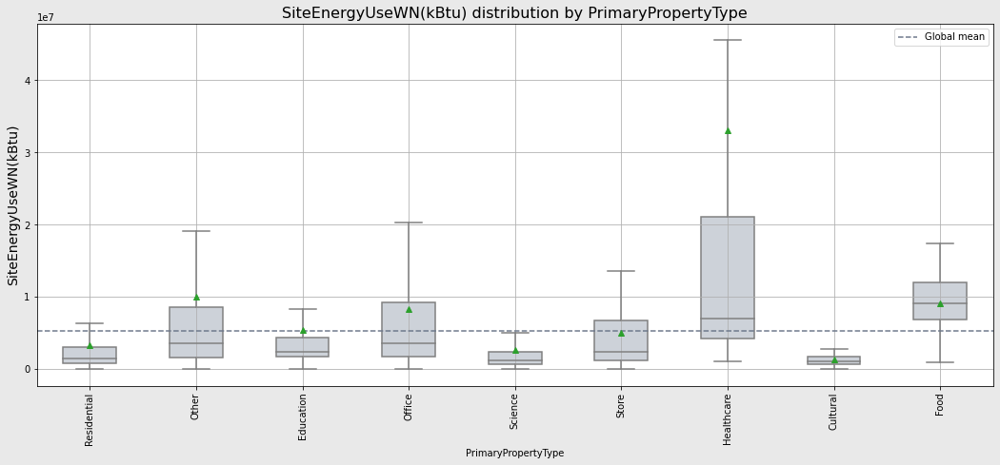

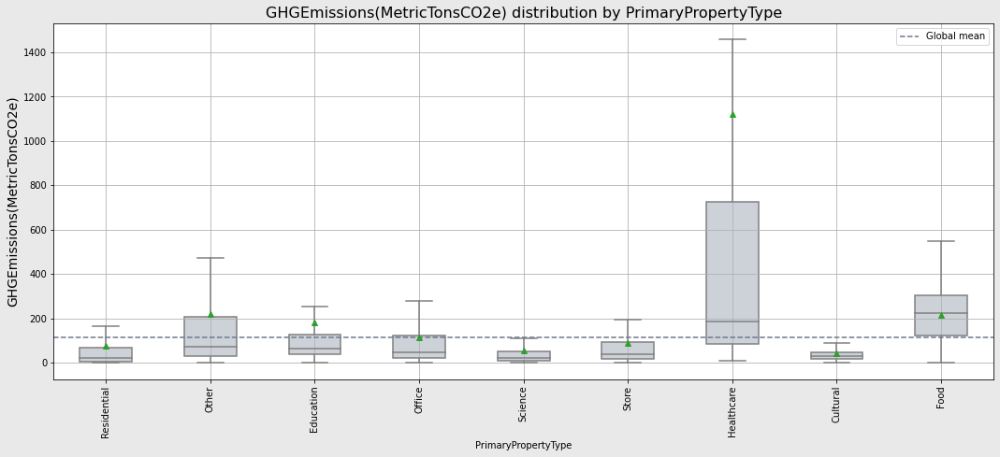

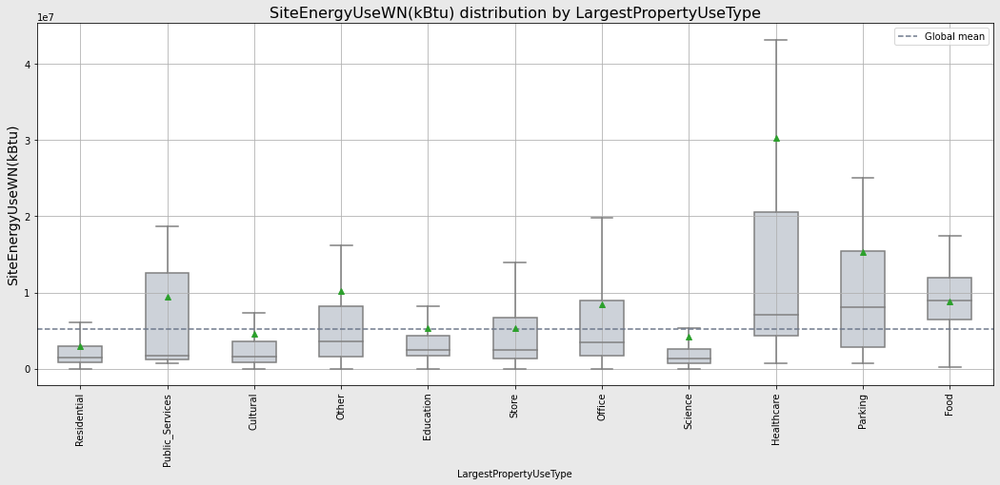

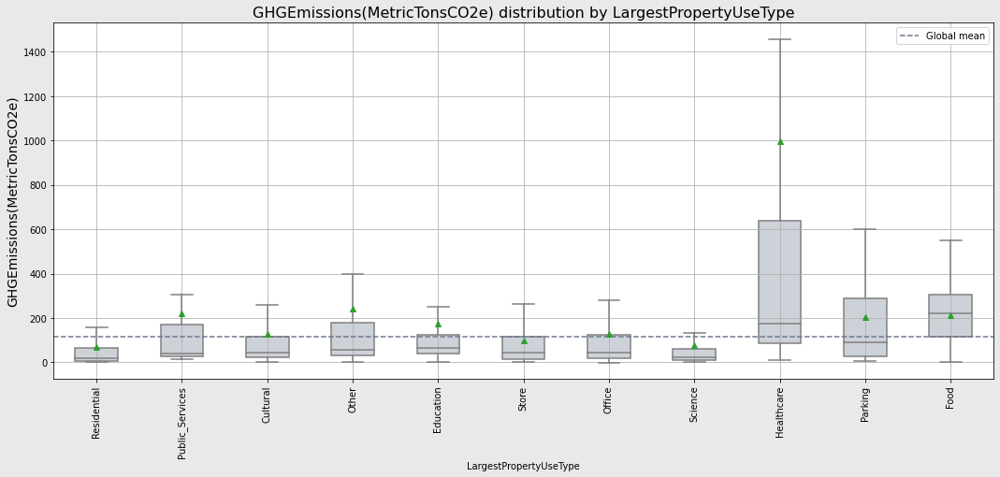

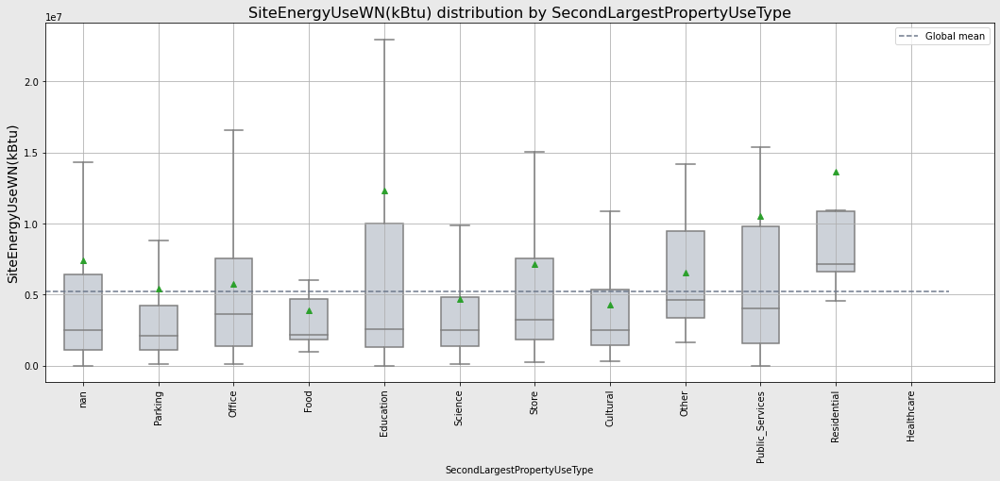

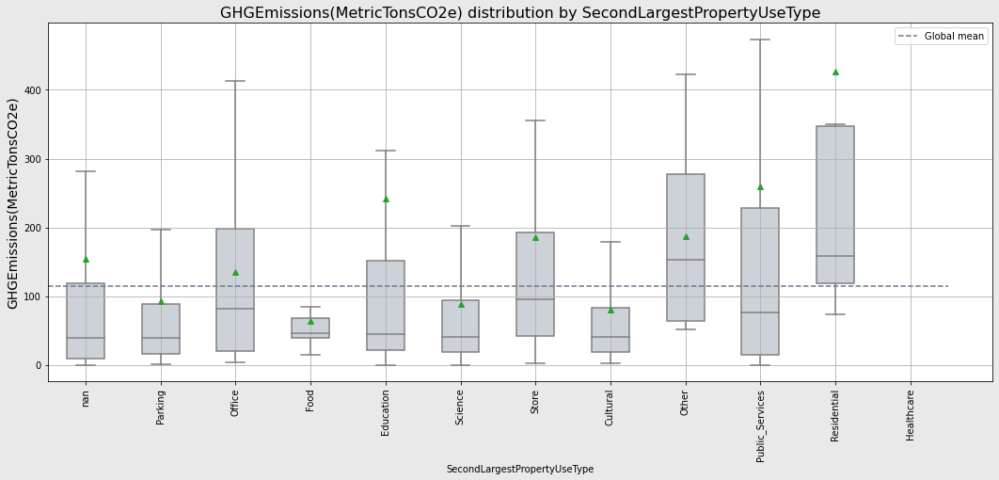

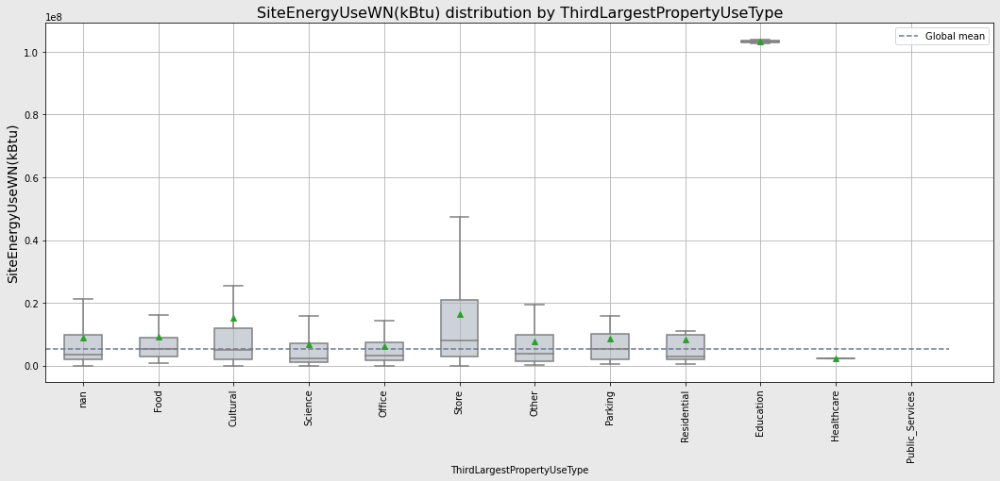

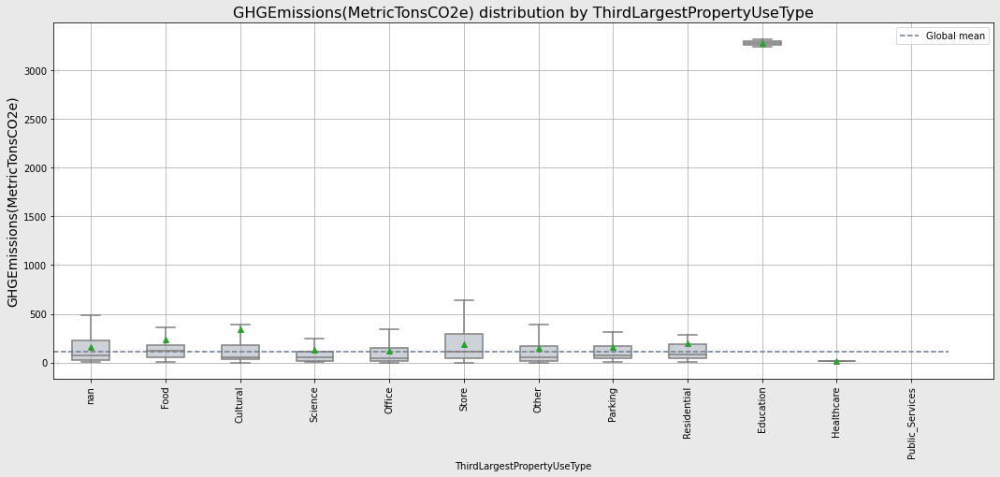

In [82]:
for var in listeCatégorie:
    visualisation(var,data,co2=0)
    visualisation(var,data,co2=1)

In [83]:
data.drop('ListOfAllPropertyUseTypes', axis=1, inplace=True)

### Analyse des variables qualitatives restantes ( 'BuildingType','Neighborhood')

In [84]:
colonne_quali=['BuildingType', 'Neighborhood','Outlier']
for col in colonne_quali:
    print('Nombre de NaN dans la colonne',col,': ', data[col].isna().sum(), 'soit :', np.round((data[col].isna().sum()/len(data)*100), decimals=2),'%')
    print(col, 'valeurs de la colonne : ', data[col].unique().tolist(), '\n')

Nombre de NaN dans la colonne BuildingType :  0 soit : 0.0 %
BuildingType valeurs de la colonne :  ['NonResidential', 'Nonresidential COS', 'Multifamily MR (5-9)', 'SPS-District K-12', 'Multifamily LR (1-4)', 'Campus', 'Multifamily HR (10+)', 'Nonresidential WA'] 

Nombre de NaN dans la colonne Neighborhood :  0 soit : 0.0 %
Neighborhood valeurs de la colonne :  ['DOWNTOWN', 'SOUTHEAST', 'NORTHEAST', 'EAST', 'CENTRAL', 'NORTH', 'MAGNOLIA / QUEEN ANNE', 'LAKE UNION', 'GREATER DUWAMISH', 'BALLARD', 'NORTHWEST', 'SOUTHWEST', 'DELRIDGE', 'Central', 'Ballard', 'North', 'Delridge', 'Northwest', 'DELRIDGE NEIGHBORHOODS'] 

Nombre de NaN dans la colonne Outlier :  6600 soit : 98.27 %
Outlier valeurs de la colonne :  [nan, 'High Outlier', 'Low Outlier', 'High outlier', 'Low outlier'] 



In [85]:
# Regroupement des catégories BuildingType
map_building= { 'Nonresidential COS' : 'NonResidential',
               'Nonresidential WA' : 'NonResidential',
                'Multifamily MR (5-9)' : 'Multifamily',
               'Multifamily HR (10+)' : 'Multifamily',
               'Multifamily LR (1-4)' : 'Multifamily'
              }      

data['BuildingType'] = data['BuildingType'].replace(map_building)

In [86]:
#Correction de la typographie
for col in colonne_quali:
    data[col]=data[col].str.title()

In [87]:
#Remplacement des Nan dans Outliers
data['Outlier'] = data['Outlier'].fillna('Lambda')

In [88]:
for col in colonne_quali:
    print('Nombre de NaN dans la colonne',col,': ', data[col].isna().sum(), 'soit :', np.round((data[col].isna().sum()/len(data)*100), decimals=2),'%')
    print(col, 'valeurs de la colonne : ', data[col].unique().tolist(), '\n')

Nombre de NaN dans la colonne BuildingType :  0 soit : 0.0 %
BuildingType valeurs de la colonne :  ['Nonresidential', 'Multifamily', 'Sps-District K-12', 'Campus'] 

Nombre de NaN dans la colonne Neighborhood :  0 soit : 0.0 %
Neighborhood valeurs de la colonne :  ['Downtown', 'Southeast', 'Northeast', 'East', 'Central', 'North', 'Magnolia / Queen Anne', 'Lake Union', 'Greater Duwamish', 'Ballard', 'Northwest', 'Southwest', 'Delridge', 'Delridge Neighborhoods'] 

Nombre de NaN dans la colonne Outlier :  0 soit : 0.0 %
Outlier valeurs de la colonne :  ['Lambda', 'High Outlier', 'Low Outlier'] 



# Vérifications des données

Text(0.5, 1.0, 'Remplissage')

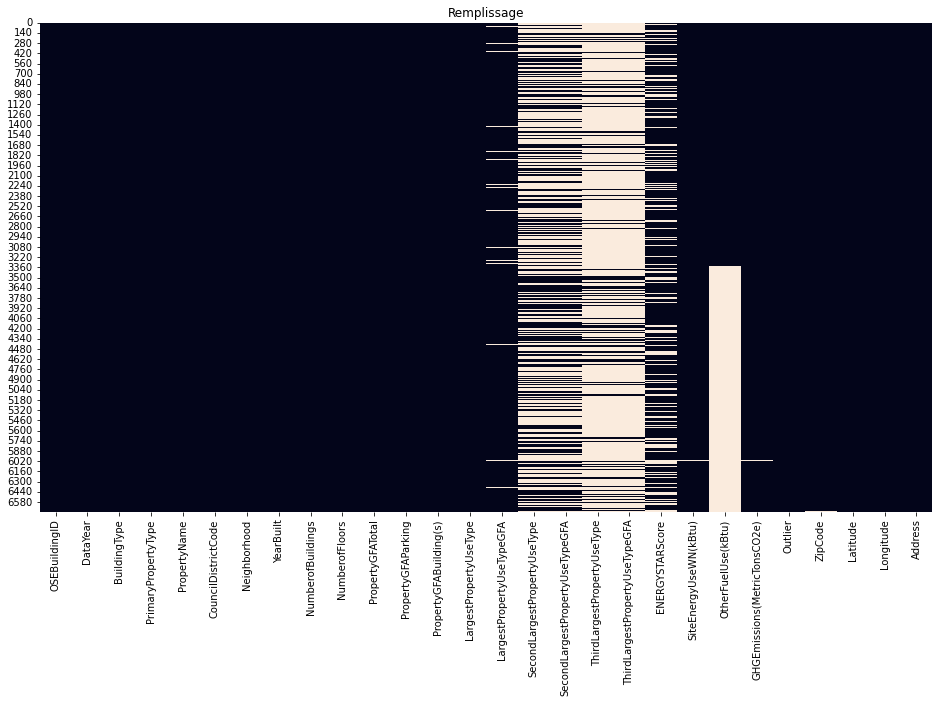

In [89]:
plt.figure(figsize=(16,9))
graph = sns.heatmap(data.isna(),cbar=False)
plt.title('Remplissage')

In [90]:
# On peut remplacer les Nan de la variable 'otherFuelUse' par zero en admettant qu'un 'nan' 
#est un choix de non-utilisation
data['OtherFuelUse(kBtu)'] = data['OtherFuelUse(kBtu)'].fillna(0)

In [91]:
# On peut remplacer les Nan des variables PropertyType par zero en admettant qu'un 'nan' 
#est un choix de non-utilisation
data[['ThirdLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA']] = data[['ThirdLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA']].fillna(0)

In [92]:
data[data['LargestPropertyUseTypeGFA'].isna()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),Outlier,ZipCode,Latitude,Longitude,Address
10,15,2015,Nonresidential,Residential,HOTEL MONACO,7,Downtown,1969,1,1,153163,19279,133884,Residential,NaN,NaN,0.000,NaN,0.000,48.000,15615929.000,0.000,576.630,Lambda,18081.000,47.607,-122.334,1101 4TH AVE
14,19,2015,Nonresidential,Residential,HOTEL VINTAGE PARK,7,Downtown,1922,1,1,67390,0,67390,Residential,NaN,NaN,0.000,NaN,0.000,14.000,11329230.000,0.000,486.250,Lambda,18081.000,47.608,-122.332,1100 5TH AVE
19,25,2015,Nonresidential,Residential,DOUBLE TREE ARCTIC CLUB HOTEL - SEATTLE,7,Downtown,1916,1,1,104352,0,104352,Residential,NaN,NaN,0.000,NaN,0.000,83.000,7816594.000,0.000,411.220,Lambda,18379.000,47.604,-122.332,700 3RD AVE
35,46,2015,Nonresidential,Science,SEATTLE WAREHOUSE OFFICE BUILDING,2,Greater Duwamish,1961,7,1,714095,0,714095,Science,NaN,NaN,0.000,NaN,0.000,1.000,46313516.000,0.000,333.540,Lambda,18800.000,47.511,-122.290,3301 S NORFOLK ST
52,67,2015,Nonresidential,Residential,QUALITY INN & SUITES - SEATTLE,7,Lake Union,1959,1,1,113173,42546,70627,Residential,NaN,NaN,0.000,NaN,0.000,86.000,5160438.000,0.000,120.730,Lambda,18390.000,47.620,-122.344,618 JOHN ST
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5885,26026,2016,Multifamily,Residential,Westwood Plaza Condominiums,1,Delridge,1981,1,3,35122,0,35122,Residential,NaN,NaN,0.000,NaN,0.000,43.000,1020896.000,0.000,6.530,Lambda,98106.000,47.525,-122.364,2421 SW Trenton St
6010,26532,2016,Nonresidential,Residential,KALBERG BUILDING,4,Northeast,1928,0,2,20760,0,20760,Residential,NaN,NaN,0.000,NaN,0.000,NaN,NaN,0.000,NaN,Lambda,98105.000,47.662,-122.313,4515 UNIVERSITY WAY NE
6226,27343,2016,Multifamily,Residential,Ravenna Woods,5,Northeast,1981,1,3,42448,0,42448,Residential,NaN,NaN,0.000,NaN,0.000,66.000,1333830.875,0.000,8.700,Lambda,98115.000,47.693,-122.303,2300 NE 89TH ST
6380,27966,2016,Multifamily,Residential,Pinehurst Lane,5,North,1997,1,4,23175,0,23175,Residential,NaN,NaN,0.000,NaN,0.000,NaN,764383.125,0.000,16.310,Lambda,98125.000,47.713,-122.312,11532 15th Ave NE


In [93]:
data[data['LargestPropertyUseTypeGFA'].isna()].index

Int64Index([  10,   14,   19,   35,   52,  160,  194,  201,  204,  233,
            ...
            5676, 5754, 5799, 5814, 5820, 5885, 6010, 6226, 6380, 6688],
           dtype='int64', length=156)

In [94]:
data.LargestPropertyUseTypeGFA = np.where(data.LargestPropertyUseTypeGFA.isnull(), data.PropertyGFATotal, data.LargestPropertyUseTypeGFA)

In [95]:
data.loc[10]

OSEBuildingID                                  15
DataYear                                     2015
BuildingType                       Nonresidential
PrimaryPropertyType                   Residential
PropertyName                         HOTEL MONACO
CouncilDistrictCode                             7
Neighborhood                             Downtown
YearBuilt                                    1969
NumberofBuildings                               1
NumberofFloors                                  1
PropertyGFATotal                           153163
PropertyGFAParking                          19279
PropertyGFABuilding(s)                     133884
LargestPropertyUseType                Residential
LargestPropertyUseTypeGFA              153163.000
SecondLargestPropertyUseType                  NaN
SecondLargestPropertyUseTypeGFA             0.000
ThirdLargestPropertyUseType                   NaN
ThirdLargestPropertyUseTypeGFA              0.000
ENERGYSTARScore                            48.000


<AxesSubplot:>

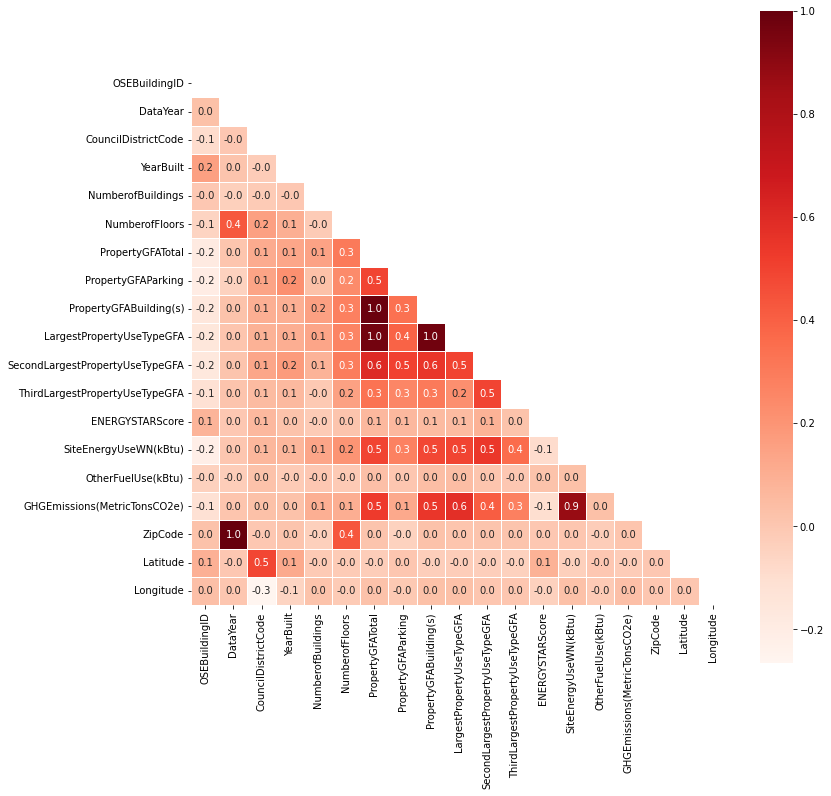

In [96]:
corr = data.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(12, 12))
plt.xticks(rotation=45)
sns.heatmap(corr, annot = True,cmap="Reds", mask = mask, fmt='.1f', linewidths=.5, square=True, vmax=1)

In [97]:
data.describe()

,OSEBuildingID,DataYear,CouncilDistrictCode,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),ZipCode,Latitude,Longitude
count,6716.000,6716.000,6716.000,6716.000,6716.000,6716.000,6716.000,6716.000,6716.000,6716.000,6716.000,6716.000,5093.000,6700.000,6716.000,6697.000,6700.000,6716.000,6716.000
mean,20867.420,2015.503,4.445,1968.102,1.017,2.863,92814.098,9519.598,83294.500,77408.994,13535.428,1938.572,67.906,5240110.201,3541.373,114.936,58570.218,47.624,-122.335
std,11878.968,0.500,2.124,33.020,0.555,4.315,187506.199,33868.051,173347.024,167181.713,39689.257,11702.088,27.012,15008958.217,138246.038,478.877,39670.097,0.048,0.027
min,1.000,2015.000,1.000,1900.000,0.000,0.000,11285.000,-3.000,-50550.000,5656.000,0.000,0.000,1.000,0.000,0.000,-0.800,17916.000,47.499,-122.414
25%,19934.000,2015.000,3.000,1948.000,1.000,1.000,28487.000,0.000,27273.000,25120.000,0.000,0.000,52.000,981802.875,0.000,9.450,18390.000,47.600,-122.351
50%,23064.000,2016.000,4.000,1974.000,1.000,1.000,44008.000,0.000,42185.000,39788.000,0.000,0.000,75.000,1926135.500,0.000,33.180,98061.500,47.619,-122.333
75%,25868.250,2016.000,7.000,1996.000,1.000,4.000,89431.250,0.000,81120.000,74889.000,10206.000,0.000,90.000,4377974.125,0.000,91.530,98115.000,47.657,-122.320
max,50226.000,2016.000,7.000,2015.000,39.000,99.000,9320156.000,512608.000,9320156.000,9320156.000,686750.000,459748.000,100.000,471613856.000,8269669.000,16870.980,98272.000,47.734,-122.220


Nous apercevons des valeurs négatives en min sur deux variables de surface : PropertyGFAParking & PropertyGFABuilding(s) 

In [98]:
data[(data['PropertyGFAParking'] < 0) | (data['PropertyGFABuilding(s)'] < 0) ] 

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),Outlier,ZipCode,Latitude,Longitude,Address
2428,25530,2015,Multifamily,Residential,WATER'S EDGE,2,Southeast,1964,1,1,20967,-3,20970,Residential,20967.000,NaN,0.000,NaN,0.000,81.000,576638.000,0.000,3.760,Lambda,18800.000,47.521,-122.260,9530 RAINIER AVE S
3136,29551,2015,Nonresidential,Office,625 5TH AVE S,2,Downtown,2000,1,1,68452,-2,68454,Office,61665.000,Office,6787.000,NaN,0.000,81.000,3988260.000,0.000,25.590,Lambda,18379.000,47.597,-122.328,625 5TH AVE S
3139,29788,2015,Nonresidential,Office,QUEEN ANNE SQUARE WEST (2013),7,Magnolia / Queen Anne,1982,1,1,54015,97325,-43310,Office,54015.000,NaN,0.000,NaN,0.000,65.000,3455247.000,0.000,24.090,Lambda,19575.000,47.625,-122.360,220 W MERCER ST
3322,50002,2015,Nonresidential,Other,FREEWAY MOTORS UNIVERSITY AUDI,4,Northeast,2014,1,1,33648,84198,-50550,Parking,83600.000,Store,39000.000,NaN,0.000,NaN,1389553.000,0.000,9.690,Lambda,18383.000,47.664,-122.317,4741 11TH AVE NE


In [99]:
# Valeur à zero du parking
data.loc[data.index == 2428, "PropertyGFAParking"] = 0
data.loc[data.index == 3136, "PropertyGFAParking"] = 0

#Erreur de remplissage en se trompant de colonne 3139 est un Bureau et 3322 un Parking
# Nous permutons les valeurs dans la colonne correspondante
data.loc[data.index == 3139, "PropertyGFATotal"] = 97325
data.loc[data.index == 3139, "PropertyGFAParking"] = 54015
data.loc[data.index == 3139, "PropertyGFABuilding(s)"] = 43310

data.loc[data.index == 3322, "PropertyGFATotal"] = 84198
data.loc[data.index == 3322, "PropertyGFAParking"] = 50550
data.loc[data.index == 3322, "PropertyGFABuilding(s)"] = 33648


Le nombre de batiment est indiqué à 0 pour certaines valeurs, ce qui est impossible

In [100]:
data[(data['NumberofBuildings'] == 0) ] 

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),Outlier,ZipCode,Latitude,Longitude,Address
3918,773,2016,Nonresidential,Office,SEATTLE BUILDING,7,Downtown,1924,0,4,63150,0,63150,Office,63150.000,NaN,0.000,NaN,0.000,NaN,NaN,0.000,NaN,Lambda,98104.000,47.604,-122.333,215 COLUMBIA ST
4098,19798,2016,Multifamily,Residential,SANDHURST APTS,4,Northeast,1977,0,3,33166,0,33166,Residential,33166.000,NaN,0.000,NaN,0.000,NaN,NaN,0.000,NaN,Lambda,98115.000,47.681,-122.265,7239 SAND POINT WAY NE
5108,23355,2016,Multifamily,Residential,GRAHAM VIEW,1,Southwest,1992,0,4,29357,0,29357,Residential,29357.000,NaN,0.000,NaN,0.000,NaN,593798.625,0.000,NaN,Lambda,98136.000,47.547,-122.387,6040 CALIFORNIA AVE SW
5132,23437,2016,Multifamily,Residential,MERCER CREST APT,7,Magnolia / Queen Anne,1957,0,4,23636,0,23636,Residential,23636.000,NaN,0.000,NaN,0.000,NaN,NaN,0.000,NaN,Lambda,98119.000,47.625,-122.364,500 W MERCER ST
5661,25431,2016,Multifamily,Residential,PONDERAY APTS,4,Northeast,1963,0,4,28472,0,28472,Residential,28472.000,NaN,0.000,NaN,0.000,NaN,797507.000,0.000,NaN,Lambda,98105.000,47.670,-122.312,5625 15TH AVE NE
5814,25752,2016,Multifamily,Residential,GRANVIEW APARTMENTS,6,Northwest,1989,0,4,29562,8531,21031,Residential,29562.000,NaN,0.000,NaN,0.000,NaN,NaN,0.000,NaN,Lambda,98103.000,47.697,-122.343,1120 N 93RD ST
5820,25763,2016,Multifamily,Residential,Villa Andora,1,Southwest,1969,0,3,30420,0,30420,Residential,30420.000,NaN,0.000,NaN,0.000,NaN,1126781.750,0.000,NaN,Lambda,98116.000,47.590,-122.386,1520 CALIFORNIA AVE SW
6010,26532,2016,Nonresidential,Residential,KALBERG BUILDING,4,Northeast,1928,0,2,20760,0,20760,Residential,20760.000,NaN,0.000,NaN,0.000,NaN,NaN,0.000,NaN,Lambda,98105.000,47.662,-122.313,4515 UNIVERSITY WAY NE


In [101]:
data.loc[data['NumberofBuildings'] == 0,'NumberofBuildings'] = 1

Vérifications des valeurs maximales du nombre de building et d'étages

In [102]:
data[(data['NumberofBuildings'] > 10) ] 

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),Outlier,ZipCode,Latitude,Longitude,Address
127,211,2015,Campus,Education,NORTH SEATTLE COMMUNITY COLLEGE CAMPUS MASTER ID,5,Northwest,1970,11,1,694072,111625,582447,Education,667265.000,NaN,0.000,NaN,0.000,NaN,39513408.000,0.000,440.310,Lambda,18377.000,47.699,-122.334,9600 COLLEGE WAY N
161,261,2015,Campus,Office,BOEING SOUTH PARK CAMPUS REPORT,1,Greater Duwamish,1980,16,1,334368,31874,302494,Office,260000.000,Science,78404.000,Parking,0.000,NaN,53294752.000,0.000,706.260,Lambda,18388.000,47.524,-122.312,1420 S TRENTON ST
1508,22062,2015,Campus,Education,SEATTLE UNIVERSITY (MAIN CAMPUS),3,East,1939,39,1,2200000,0,2200000,Education,1719643.000,Parking,318960.000,NaN,0.000,NaN,131427232.000,0.000,3232.230,Lambda,19578.000,47.609,-122.315,901 12TH AVE


In [103]:
data[(data['NumberofFloors'] > 50) ] 

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),Outlier,ZipCode,Latitude,Longitude,Address
3573,357,2016,Nonresidential,Office,Seattle Municipal Tower (2030),3,Downtown,1990,1,63,1354987,159600,1195387,Office,1191115.000,Parking,159599.000,Other,18656.000,89.000,61576184.000,0.000,429.270,Lambda,98104.000,47.605,-122.330,700 Fifth Avenue
3611,399,2016,Nonresidential,Office,1201 Third Avenue,7,Downtown,1988,1,55,1400000,285000,1115000,Office,994116.000,Parking,264481.000,Other,133598.000,92.000,55140300.000,0.000,588.900,Lambda,98101.000,47.607,-122.336,1201 3rd ave
3632,422,2016,Nonresidential,Office,Two Union Square,7,Downtown,1989,1,56,1605578,389860,1215718,Office,1314475.000,Parking,389860.000,Other,30744.000,97.000,50984500.000,0.000,525.780,Lambda,98101.000,47.610,-122.332,601 Union St.
3899,775,2016,Nonresidential,Office,Columbia Center - 2015,7,Downtown,1985,1,76,1952220,319400,1632820,Office,1680937.000,Parking,319368.000,NaN,0.000,86.000,92537256.000,0.000,882.560,Lambda,98104.000,47.605,-122.331,701 5th Avenue
4699,21611,2016,Nonresidential,Cultural,Seattle Chinese Baptist Church,2,Greater Duwamish,1977,1,99,21948,0,21948,Cultural,21948.000,NaN,0.000,NaN,0.000,80.000,326001.188,0.000,2.270,Lambda,98108.000,47.551,-122.303,5801 Beacon Avenue South


Pour le nombr de batiments, les valeurs extremes semblent cohérentes cependant pour la variable 'NumberofFloors' avec un étage de 99 pour une église est une erreur.

In [104]:
data.loc[data.index == 4699, "NumberofFloors"] = 1

## Vérifications des outliers

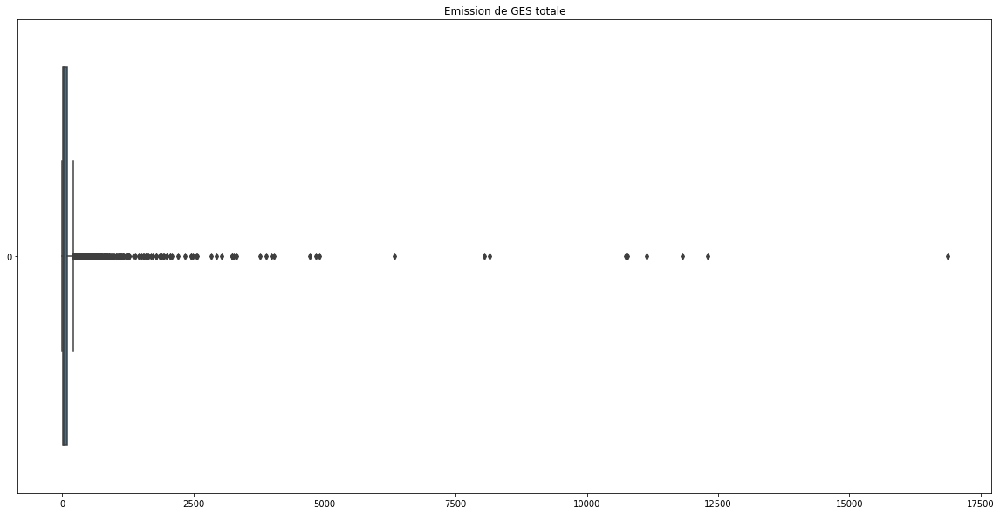

In [105]:
plt.figure(figsize=(20,10))
sns.boxplot(data=data['GHGEmissions(MetricTonsCO2e)'], orient='h')
plt.title("Emission de GES totale")
plt.show()

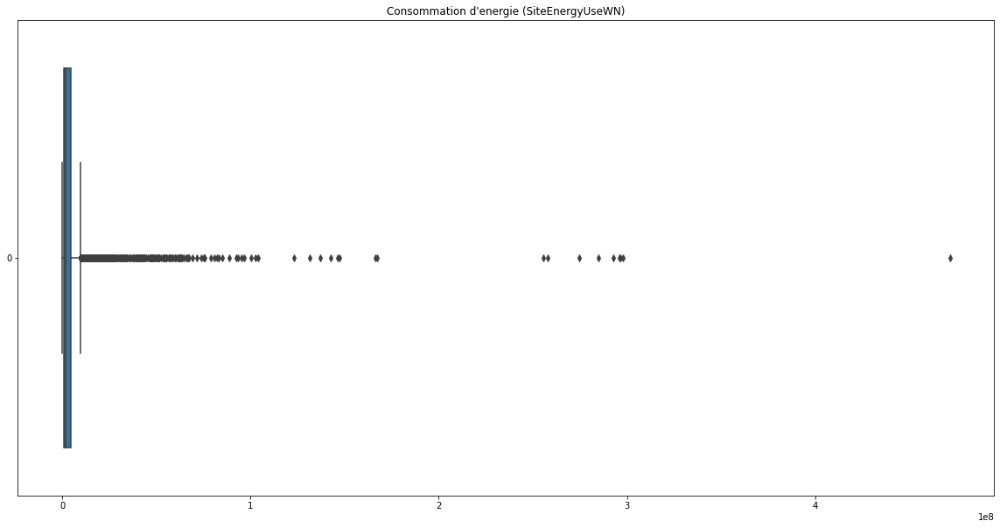

In [106]:
plt.figure(figsize=(20,10))
sns.boxplot(data=data['SiteEnergyUseWN(kBtu)'], orient='h')
plt.title("Consommation d'energie (SiteEnergyUseWN)")
plt.show()

67  Outliers
     OSEBuildingID  DataYear    BuildingType PrimaryPropertyType  \
2                3      2015  Nonresidential         Residential   
20              26      2015  Nonresidential               Other   
49              63      2015  Nonresidential         Residential   
98             147      2015  Nonresidential          Healthcare   
123            198      2015  Nonresidential          Healthcare   

                                   PropertyName  CouncilDistrictCode  \
2                                  WESTIN HOTEL                    7   
20                       KING COUNTY COURTHOUSE                    7   
49                               SHERATON HOTEL                    7   
98        SWEDISH MEDICAL CENTER BALLARD CAMPUS                    6   
123  SEATTLE CHILDREN'S HOSPITAL  (MAIN CAMPUS)                    4   

    Neighborhood  YearBuilt  NumberofBuildings  NumberofFloors  \
2       Downtown       1969                  1               1   
20      Downt

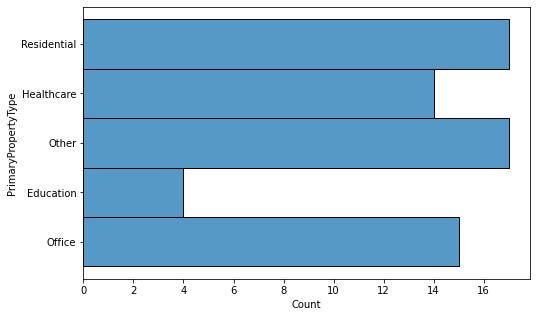

In [107]:
outlier_energy = data['SiteEnergyUseWN(kBtu)'].quantile(0.99)
data_outlier_energy = data[data['SiteEnergyUseWN(kBtu)'] > outlier_energy]
graph_outlier_energy = data_outlier_energy[['PrimaryPropertyType','PropertyName','SiteEnergyUseWN(kBtu)']].sort_values(by = 'SiteEnergyUseWN(kBtu)',ascending = False)
print(len(data_outlier_energy), ' Outliers')
print(data_outlier_energy.head())
plt.figure(figsize=(8,5))
sns.histplot(graph_outlier_energy, y = 'PrimaryPropertyType')
plt.show()

67  Outliers
     PrimaryPropertyType                                       PropertyName  \
3375         Residential                                       Plant 2 Site   
3958          Healthcare                                 Swedish First Hill   
621           Healthcare  SWEDISH HOSPITAL MEDICAL CENTER First Hill Campus   
6614           Education          University of Washington - Seattle Campus   
170           Healthcare                          HARBORVIEW MEDICAL CENTER   

      GHGEmissions(MetricTonsCO2e)  
3375                     16870.980  
3958                     12307.160  
621                      11824.890  
6614                     11140.560  
170                      10780.640  


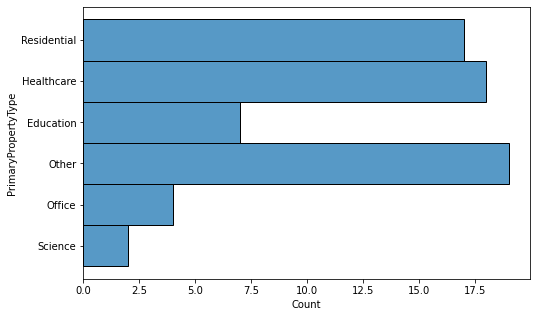

In [108]:
outlier_c02 = data['GHGEmissions(MetricTonsCO2e)'].quantile(0.99)
data_outlier_co2 = data[data['GHGEmissions(MetricTonsCO2e)'] > outlier_c02]
graph_outlier_co2 = data_outlier_co2[['PrimaryPropertyType','PropertyName','GHGEmissions(MetricTonsCO2e)']].sort_values(by = 'GHGEmissions(MetricTonsCO2e)',ascending = False)
print(len(data_outlier_co2), ' Outliers')
print(graph_outlier_co2.head())
plt.figure(figsize=(8,5))
sns.histplot(graph_outlier_co2, y = 'PrimaryPropertyType')
plt.show()

In [109]:
import folium
carte = folium.Map()
carte = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()],
                   zoom_start=11)
for i in range(0,len(data)):
    if i in data_outlier_co2.index:
        folium.Circle([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']],color='blue',
            fill_color='red', popup=data.iloc[i]['PropertyName'], radius =100).add_to(carte)

    if i in data_outlier_energy.index:
            folium.Circle([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']],color='red',
            fill_color='green', popup=data.iloc[i]['PropertyName'], radius =100).add_to(carte)
    
    if (i in data_outlier_co2.index) & ( i in data_outlier_energy.index):
            folium.Circle([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']],color='purple',
                      popup=data.iloc[i]['PropertyName'], radius =100).add_to(carte)
carte

Les Outliers sont des batiments couteux comme des hopitaux, aeroport ou grand palace. 

## Encodage des valeurs catégorielles

In [110]:
data.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'CouncilDistrictCode', 'Neighborhood', 'YearBuilt',
       'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEnergyUseWN(kBtu)', 'OtherFuelUse(kBtu)',
       'GHGEmissions(MetricTonsCO2e)', 'Outlier', 'ZipCode', 'Latitude',
       'Longitude', 'Address'],
      dtype='object')

In [111]:
data['PrimaryPropertyType']

0       Residential
1       Residential
2       Residential
3       Residential
4       Residential
           ...     
6711         Office
6712          Other
6713          Other
6714    Residential
6715    Residential
Name: PrimaryPropertyType, Length: 6716, dtype: object

In [112]:
data_encod= data.copy()
Type = ['BuildingType','Outlier','PrimaryPropertyType','LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType']      
data_encod = pd.get_dummies(data_encod,columns=Type,drop_first=True)
data_encod = pd.get_dummies(data_encod,columns=['CouncilDistrictCode'],drop_first=True)

In [113]:
data_encod

,OSEBuildingID,DataYear,PropertyName,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),ZipCode,Latitude,Longitude,Address,BuildingType_Multifamily,BuildingType_Nonresidential,BuildingType_Sps-District K-12,Outlier_Lambda,Outlier_Low Outlier,PrimaryPropertyType_Education,PrimaryPropertyType_Food,PrimaryPropertyType_Healthcare,PrimaryPropertyType_Office,PrimaryPropertyType_Other,PrimaryPropertyType_Residential,PrimaryPropertyType_Science,PrimaryPropertyType_Store,LargestPropertyUseType_Education,LargestPropertyUseType_Food,LargestPropertyUseType_Healthcare,LargestPropertyUseType_Office,LargestPropertyUseType_Other,LargestPropertyUseType_Parking,LargestPropertyUseType_Public_Services,LargestPropertyUseType_Residential,LargestPropertyUseType_Science,LargestPropertyUseType_Store,SecondLargestPropertyUseType_Education,SecondLargestPropertyUseType_Food,SecondLargestPropertyUseType_Healthcare,SecondLargestPropertyUseType_Office,SecondLargestPropertyUseType_Other,SecondLargestPropertyUseType_Parking,SecondLargestPropertyUseType_Public_Services,SecondLargestPropertyUseType_Residential,SecondLargestPropertyUseType_Science,SecondLargestPropertyUseType_Store,ThirdLargestPropertyUseType_Education,ThirdLargestPropertyUseType_Food,ThirdLargestPropertyUseType_Healthcare,ThirdLargestPropertyUseType_Office,ThirdLargestPropertyUseType_Other,ThirdLargestPropertyUseType_Parking,ThirdLargestPropertyUseType_Public_Services,ThirdLargestPropertyUseType_Residential,ThirdLargestPropertyUseType_Science,ThirdLargestPropertyUseType_Store,CouncilDistrictCode_2,CouncilDistrictCode_3,CouncilDistrictCode_4,CouncilDistrictCode_5,CouncilDistrictCode_6,CouncilDistrictCode_7
0,1,2015,MAYFLOWER PARK HOTEL,Downtown,1927,1,1,88434,0,88434,88434.000,0.000,0.000,65.000,7097539.000,0.000,249.430,18081.000,47.612,-122.338,405 OLIVE WAY,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,2,2015,PARAMOUNT HOTEL,Downtown,1996,1,1,103566,15064,88502,83880.000,15064.000,4622.000,51.000,8765788.000,0.000,263.510,18081.000,47.613,-122.333,724 PINE ST,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,3,2015,WESTIN HOTEL,Downtown,1969,1,1,961990,0,961990,757243.000,100000.000,0.000,18.000,75506272.000,0.000,2061.480,18081.000,47.613,-122.338,1900 5TH AVE,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,5,2015,HOTEL MAX,Downtown,1926,1,1,61320,0,61320,61320.000,0.000,0.000,1.000,28363444.000,0.000,1936.340,18081.000,47.614,-122.337,620 STEWART ST,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,8,2015,WARWICK SEATTLE HOTEL,Downtown,1980,1,1,119890,12460,107430,123445.000,68009.000,0.000,67.000,15078243.000,0.000,507.700,19576.000,47.614,-122.341,401 LENORA ST,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6711,50222,2016,Horticulture building,Greater Duwamish,1990,1,1,12294,0,12294,12294.000,0.000,0.000,46.000,943003.188,0.000,20.940,NaN,47.567,-122.312,1600 S Dakota St,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
6712,50223,2016,International district/Chinatown CC,Downtown,2004,1,1,16000,0,16000,16000.000,0.000,0.000,NaN,1053705.750,0.000,32.170,NaN,47.596,-122.323,719 8th Ave S,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0

### Feature Engine


On peut tout d'abord déduire l'age d'un batiment en regroupant les variables DataYear et YearBuilt

In [114]:
data_encod['Age']=data_encod['DataYear']-data_encod['YearBuilt']

In [115]:
data_encod['Age'].describe()

count   6716.000
mean      47.401
std       33.017
min        0.000
25%       19.000
50%       41.500
75%       68.000
max      116.000
Name: Age, dtype: float64

In [116]:
data_encod['RatioLargestUseGFA'] = data_encod[ 'LargestPropertyUseTypeGFA']/data_encod['PropertyGFATotal']
data_encod['RatioSecondUseGFA'] = data_encod['SecondLargestPropertyUseTypeGFA']/data_encod['PropertyGFATotal']
data_encod['RatioThirdUseGFA'] = data_encod[ 'ThirdLargestPropertyUseTypeGFA']/data_encod['PropertyGFATotal']

## Mise à l'échelle des targets

Nous avons vu une distribution asymétrique sur nos target. On va procéder à une normalization afin d'obtenir une meilleure distribution.

In [117]:
print('skewness SiteEnergyUseWN(kBtu):',stats.skew(data_encod['SiteEnergyUseWN(kBtu)']))

print('skewness GHGEmissions(MetricTonsCO2e):',stats.skew(data_encod['GHGEmissions(MetricTonsCO2e)']))

skewness SiteEnergyUseWN(kBtu): nan
skewness GHGEmissions(MetricTonsCO2e): nan


In [118]:
data_encod = data_encod[data_encod['SiteEnergyUseWN(kBtu)']>0]
data_encod = data_encod[data_encod['GHGEmissions(MetricTonsCO2e)']>0]

In [119]:
energy_log = np.log(data_encod['SiteEnergyUseWN(kBtu)'])
energy_log2 = np.log2(data_encod['SiteEnergyUseWN(kBtu)'])
energy_log10 = np.log10(data_encod['SiteEnergyUseWN(kBtu)'])

In [120]:
Co2_log = np.log(data_encod['GHGEmissions(MetricTonsCO2e)'])
Co2_log2 = np.log2(data_encod['GHGEmissions(MetricTonsCO2e)'])
Co2_log10 = np.log10(data_encod['GHGEmissions(MetricTonsCO2e)'])

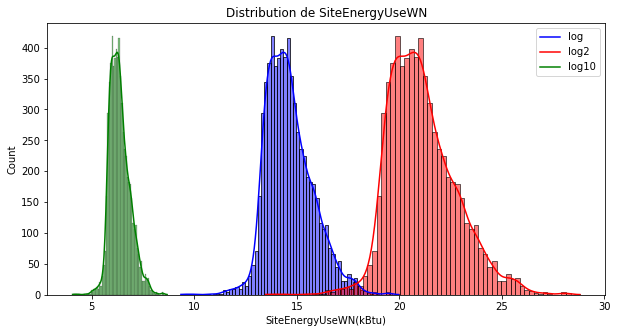

In [121]:
plt.title('Distribution de SiteEnergyUseWN')
sns.histplot(energy_log, kde = True, color = 'blue')
sns.histplot(energy_log2, kde = True, color = 'red')
sns.histplot(energy_log10, kde = True, color = 'green')
ax = plt.gca()
ax.legend(['log','log2', 'log10'])

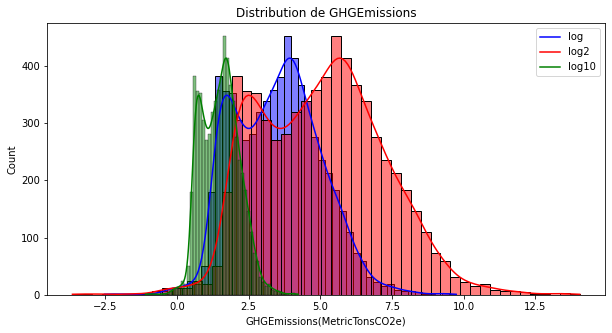

In [122]:
plt.title('Distribution de GHGEmissions')
sns.histplot(Co2_log, kde = True, color = 'blue')
sns.histplot(Co2_log2, kde = True, color = 'red')
sns.histplot(Co2_log10, kde = True, color = 'green')
ax = plt.gca()
ax.legend(['log','log2', 'log10'])

In [123]:
data_encod['SiteEnergyUseWN_log']=np.log(data_encod['SiteEnergyUseWN(kBtu)'])
data_encod['GHGEmissions_log10']=np.log10(data_encod['GHGEmissions(MetricTonsCO2e)'])

<AxesSubplot:>

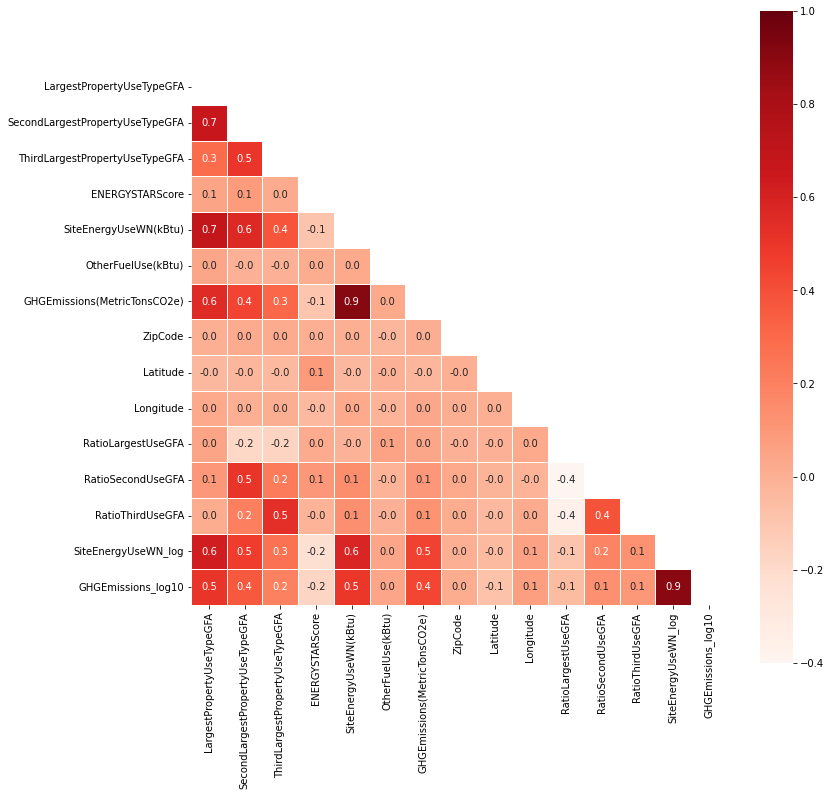

In [124]:
corr = data_encod.select_dtypes(['int32', 'float64']).corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(12, 12))
plt.xticks(rotation=45)
sns.heatmap(corr, annot = True,cmap="Reds", mask = mask, fmt='.1f', linewidths=.5, square=True, vmax=1)

## Préparation à l'analyse

In [125]:
data_encod.columns

Index(['OSEBuildingID', 'DataYear', 'PropertyName', 'Neighborhood',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore',
       'SiteEnergyUseWN(kBtu)', 'OtherFuelUse(kBtu)',
       'GHGEmissions(MetricTonsCO2e)', 'ZipCode', 'Latitude', 'Longitude',
       'Address', 'BuildingType_Multifamily', 'BuildingType_Nonresidential',
       'BuildingType_Sps-District K-12', 'Outlier_Lambda',
       'Outlier_Low Outlier', 'PrimaryPropertyType_Education',
       'PrimaryPropertyType_Food', 'PrimaryPropertyType_Healthcare',
       'PrimaryPropertyType_Office', 'PrimaryPropertyType_Other',
       'PrimaryPropertyType_Residential', 'PrimaryPropertyType_Science',
       'PrimaryPropertyType_Store', 'LargestPropertyUseType_Education',
       'LargestPropertyUseType_Food', 'LargestPropertyUseTy

Colonnes à supprimer : 
'OSEBuildingID',
'DataYear',
'PropertyName',
'BuildingType',
'Neighborhood',
'YearBuilt',
'ZipCode', 
'Address',
'SiteEnergyUseWN(kBtu)',
'OtherFuelUse(kBtu)',
'GHGEmissions(MetricTonsCO2e)',  
'PropertyGFATotal',
'PropertyGFAParking',
'PropertyGFABuilding(s)',
'LargestPropertyUseTypeGFA',
'SecondLargestPropertyUseTypeGFA',
'ThirdLargestPropertyUseTypeGFA',
'Address',
'SiteEnergyUse(kBtu)'

In [126]:
col_drop = ['OSEBuildingID',
'DataYear',
'PropertyName',
'Neighborhood',
'YearBuilt',
'ZipCode', 
'Address',
'SiteEnergyUseWN(kBtu)',
'OtherFuelUse(kBtu)',
'GHGEmissions(MetricTonsCO2e)',  
'PropertyGFATotal',
'PropertyGFAParking',
'PropertyGFABuilding(s)',
'LargestPropertyUseTypeGFA',
'SecondLargestPropertyUseTypeGFA',
'ThirdLargestPropertyUseTypeGFA',
'Address']

In [127]:
data_analyse=data_encod.drop(col_drop, axis=1)

In [128]:
data_analyse.shape

(6652, 60)

In [129]:
data_analyse.head(10)

,NumberofBuildings,NumberofFloors,ENERGYSTARScore,Latitude,Longitude,BuildingType_Multifamily,BuildingType_Nonresidential,BuildingType_Sps-District K-12,Outlier_Lambda,Outlier_Low Outlier,PrimaryPropertyType_Education,PrimaryPropertyType_Food,PrimaryPropertyType_Healthcare,PrimaryPropertyType_Office,PrimaryPropertyType_Other,PrimaryPropertyType_Residential,PrimaryPropertyType_Science,PrimaryPropertyType_Store,LargestPropertyUseType_Education,LargestPropertyUseType_Food,LargestPropertyUseType_Healthcare,LargestPropertyUseType_Office,LargestPropertyUseType_Other,LargestPropertyUseType_Parking,LargestPropertyUseType_Public_Services,LargestPropertyUseType_Residential,LargestPropertyUseType_Science,LargestPropertyUseType_Store,SecondLargestPropertyUseType_Education,SecondLargestPropertyUseType_Food,SecondLargestPropertyUseType_Healthcare,SecondLargestPropertyUseType_Office,SecondLargestPropertyUseType_Other,SecondLargestPropertyUseType_Parking,SecondLargestPropertyUseType_Public_Services,SecondLargestPropertyUseType_Residential,SecondLargestPropertyUseType_Science,SecondLargestPropertyUseType_Store,ThirdLargestPropertyUseType_Education,ThirdLargestPropertyUseType_Food,ThirdLargestPropertyUseType_Healthcare,ThirdLargestPropertyUseType_Office,ThirdLargestPropertyUseType_Other,ThirdLargestPropertyUseType_Parking,ThirdLargestPropertyUseType_Public_Services,ThirdLargestPropertyUseType_Residential,ThirdLargestPropertyUseType_Science,ThirdLargestPropertyUseType_Store,CouncilDistrictCode_2,CouncilDistrictCode_3,CouncilDistrictCode_4,CouncilDistrictCode_5,CouncilDistrictCode_6,CouncilDistrictCode_7,Age,RatioLargestUseGFA,RatioSecondUseGFA,RatioThirdUseGFA,SiteEnergyUseWN_log,GHGEmissions_log10
0,1,1,65.000,47.612,-122.338,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,88,1.000,0.000,0.000,15.775,2.397
1,1,1,51.000,47.613,-122.333,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,19,0.810,0.145,0.045,15.986,2.421
2,1,1,18.000,47.613,-122.338,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,46,0.787,0.104,0.000,18.140,3.314
3,1,1,1.000,47.614,-122.337,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,89,1.000,0.000,0.000,17.161,3.287
4,1,1,67.000,47.614,-122.341,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,35,1.030,0.567,0.000,16.529,2.706
5,1,1,NaN,47.616,-122.337,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,16,0.913,0.000,0.000,16.384,2.484
6,1,1,25.000,47.614,-122.333,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,89,0.980,0.000,0.000,15.684,2.319
7,1,1,NaN,47.613,-122.331,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,89,1.000,0.000,0.000,15.814,2.301
8,1,1,46.000,47.603,-122.333,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,111,1.000,0.000,0.000,16.425,2.521
9,1,1,2.000,47.603,-122.332,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,105,0.881,0.000,0.000,15.465,2.230


<AxesSubplot:>

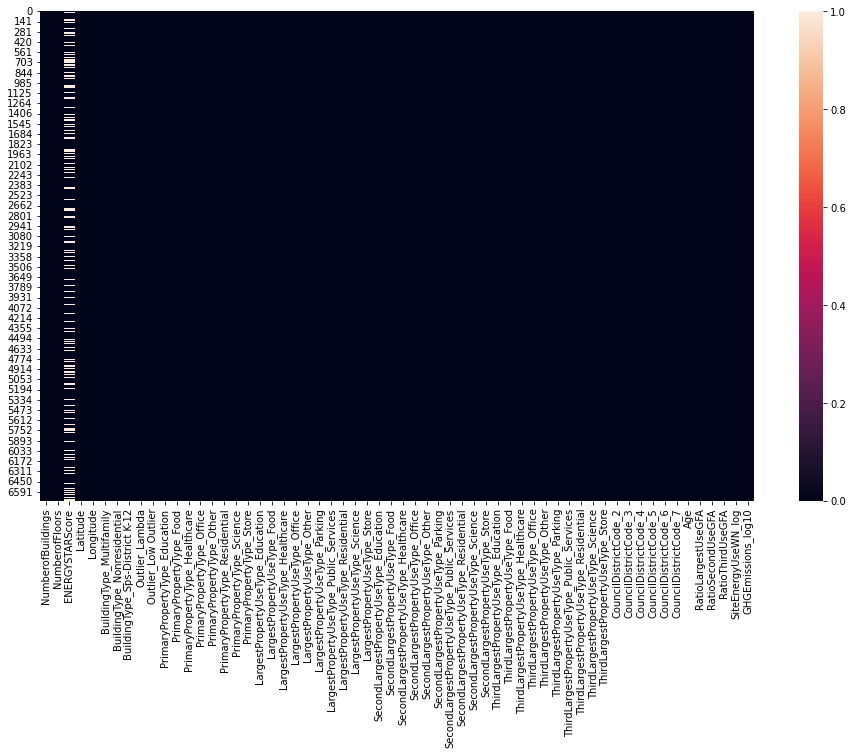

In [130]:
plt.figure(figsize=(16,9))
sns.heatmap(data_analyse.isna())

In [132]:
data_analyse.to_csv('data_analyse.csv')